In [1]:
# ============================================================================
# STEP 1: MOUNT GOOGLE DRIVE AND INSTALL LIBRARIES
# ============================================================================
print("=" * 80)
print("STEP 1.1: Mounting Google Drive")
print("=" * 80)

from google.colab import drive
drive.mount('/content/drive')

print("Google Drive mounted successfully!")
print()

# ============================================================================
print("=" * 80)
print("STEP 1.2: Installing Required Libraries")
print("=" * 80)

# Install quantum computing libraries
print("Installing PennyLane (Quantum ML framework)...")
!pip install pennylane pennylane-qiskit -q

# Install deep learning libraries
print("Installing PyTorch and vision libraries...")
!pip install torch torchvision -q

# Install computer vision and utilities
print("Installing CV and utility libraries...")
!pip install ultralytics opencv-python-headless -q
!pip install seaborn matplotlib pandas pillow lxml -q
!pip install scikit-learn -q

print("All libraries installed successfully!")
print()

STEP 1.1: Mounting Google Drive
Mounted at /content/drive
Google Drive mounted successfully!

STEP 1.2: Installing Required Libraries
Installing PennyLane (Quantum ML framework)...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 112.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.3/934.3 kB 63.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 88.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 106.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 78.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.9/167.9 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# ============================================================================
print("=" * 80)
print("STEP 1.3: Importing Libraries")
print("=" * 80)

import os
import shutil
import zipfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import xml.etree.ElementTree as ET
from tqdm import tqdm
import warnings
import json
from collections import defaultdict, Counter
from datetime import datetime
warnings.filterwarnings('ignore')

# Deep Learning imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from PIL import Image

# Quantum Computing imports
import pennylane as qml

# Computer Vision imports
import cv2

# Sklearn imports
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    torch.cuda.manual_seed_all(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("All libraries imported successfully!")
print()
print("Library Versions:")
print("-" * 80)
print(f"PyTorch version: {torch.__version__}")
print(f"PennyLane version: {qml.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")
print()
print("Hardware Information:")
print("-" * 80)
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU Device: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB")
    device = torch.device('cuda')
else:
    print("No GPU available - using CPU")
    device = torch.device('cpu')
print(f"Using device: {device}")
print()

STEP 1.3: Importing Libraries
All libraries imported successfully!

Library Versions:
--------------------------------------------------------------------------------
PyTorch version: 2.9.0+cu126
PennyLane version: 0.43.2
NumPy version: 2.0.2
Pandas version: 2.2.2

Hardware Information:
--------------------------------------------------------------------------------
CUDA available: True
GPU Device: Tesla T4
GPU Memory: 14.74 GB
Using device: cuda



In [3]:
# ============================================================================
# STEP 2: EXTRACT AND VERIFY DATASET
# ============================================================================
print("=" * 80)
print("STEP 2.1: Extracting Dataset from Google Drive")
print("=" * 80)

# Define paths
zip_path = '/content/drive/MyDrive/AppleDataset/VOC2007.zip'
extract_path = '/content/dataset'

# Check if zip exists
if not os.path.exists(zip_path):
    print(f"ERROR: ZIP file not found at {zip_path}")
    print("Please check the path in Google Drive!")
    raise FileNotFoundError(f"Dataset not found: {zip_path}")
else:
    print(f"Found ZIP file: {zip_path}")

    # Get file size
    file_size = os.path.getsize(zip_path) / (1024**2)  # Convert to MB
    print(f"File size: {file_size:.2f} MB")

    # Remove old extraction if exists
    if os.path.exists(extract_path):
        print(f"Removing old extraction folder...")
        shutil.rmtree(extract_path)

    # Create extraction directory
    os.makedirs(extract_path, exist_ok=True)

    # Extract with progress
    print(f"\nExtracting dataset to {extract_path}...")
    print("This may take a few minutes for 12,996 images...")

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        file_list = zip_ref.namelist()
        print(f"Total files in ZIP: {len(file_list)}")

        # Extract with progress bar
        for file in tqdm(file_list, desc="Extracting"):
            zip_ref.extract(file, extract_path)

    print(f"\nDataset extracted successfully!")

print()

# ============================================================================
print("=" * 80)
print("STEP 2.2: Locating VOC2007 Folder and Verifying Structure")
print("=" * 80)

# Find VOC2007 folder (it might be nested)
voc_folders = list(Path(extract_path).rglob('VOC2007'))
if voc_folders:
    voc_path = str(voc_folders[0])
    print(f"Found VOC2007 folder at: {voc_path}")
else:
    # Check if files are directly in extract_path
    if os.path.exists(os.path.join(extract_path, 'Annotations')):
        voc_path = extract_path
        print(f"VOC2007 files found directly at: {voc_path}")
    else:
        print("ERROR: Could not locate VOC2007 folder!")
        print(f"Contents of {extract_path}:")
        for item in os.listdir(extract_path):
            print(f"  - {item}")
        raise FileNotFoundError("VOC2007 folder not found")

# Verify folder structure
annotations_path = os.path.join(voc_path, 'Annotations')
images_path = os.path.join(voc_path, 'JPEGImages')
imagesets_path = os.path.join(voc_path, 'ImageSets', 'Main')

print("\nVerifying folder structure:")
print(f"  Annotations: {'Found' if os.path.exists(annotations_path) else 'Missing'}")
print(f"  JPEGImages: {'Found' if os.path.exists(images_path) else 'Missing'}")
print(f"  ImageSets/Main: {'Found' if os.path.exists(imagesets_path) else 'Missing'}")

# Count files
if os.path.exists(annotations_path):
    num_annotations = len([f for f in os.listdir(annotations_path) if f.endswith('.xml')])
    print(f"\n  Total XML annotations: {num_annotations}")

if os.path.exists(images_path):
    num_images = len([f for f in os.listdir(images_path) if f.endswith(('.jpg', '.jpeg', '.png'))])
    print(f"  Total images: {num_images}")

if os.path.exists(imagesets_path):
    split_files = [f for f in os.listdir(imagesets_path) if f.endswith('.txt')]
    print(f"  Split files found: {split_files}")

    # Read split files
    for split_file in split_files:
        split_path = os.path.join(imagesets_path, split_file)
        with open(split_path, 'r') as f:
            count = len(f.readlines())
        print(f"      - {split_file}: {count} images")

print()

# ============================================================================
print("=" * 80)
print("STEP 2.3: Saving Paths for Future Steps")
print("=" * 80)

# Save important paths
DATASET_PATH = voc_path
ANNOTATIONS_PATH = os.path.join(voc_path, 'Annotations')
IMAGES_PATH = os.path.join(voc_path, 'JPEGImages')
IMAGESETS_PATH = os.path.join(voc_path, 'ImageSets', 'Main')

# Create output directories
OUTPUT_DIR = '/content/outputs'
EDA_DIR = os.path.join(OUTPUT_DIR, 'eda')
MODELS_DIR = os.path.join(OUTPUT_DIR, 'qcnn_models')
RESULTS_DIR = os.path.join(OUTPUT_DIR, 'qcnn_results')

for dir_path in [OUTPUT_DIR, EDA_DIR, MODELS_DIR, RESULTS_DIR]:
    os.makedirs(dir_path, exist_ok=True)

print(f"Paths saved:")
print(f"   DATASET_PATH: {DATASET_PATH}")
print(f"   ANNOTATIONS_PATH: {ANNOTATIONS_PATH}")
print(f"   IMAGES_PATH: {IMAGES_PATH}")
print(f"   IMAGESETS_PATH: {IMAGESETS_PATH}")
print(f"\nOutput directories created:")
print(f"   EDA_DIR: {EDA_DIR}")
print(f"   MODELS_DIR: {MODELS_DIR}")
print(f"   RESULTS_DIR: {RESULTS_DIR}")
print()

print("=" * 80)
print("STEP 2 COMPLETED SUCCESSFULLY!")
print("=" * 80)
print()

STEP 2.1: Extracting Dataset from Google Drive
Found ZIP file: /content/drive/MyDrive/AppleDataset/VOC2007.zip
File size: 9154.27 MB

Extracting dataset to /content/dataset...
This may take a few minutes for 12,996 images...
Total files in ZIP: 24535


Extracting: 100%|██████████| 24535/24535 [03:14<00:00, 126.43it/s]



Dataset extracted successfully!

STEP 2.2: Locating VOC2007 Folder and Verifying Structure
Found VOC2007 folder at: /content/dataset/VOC2007

Verifying folder structure:
  Annotations: Found
  JPEGImages: Found
  ImageSets/Main: Found

  Total XML annotations: 12263
  Total images: 12263
  Split files found: ['validation.txt', 'test.txt', 'trainval.txt', 'train.txt']
      - validation.txt: 3065 images
      - test.txt: 6132 images
      - trainval.txt: 6131 images
      - train.txt: 3066 images

STEP 2.3: Saving Paths for Future Steps
Paths saved:
   DATASET_PATH: /content/dataset/VOC2007
   ANNOTATIONS_PATH: /content/dataset/VOC2007/Annotations
   IMAGES_PATH: /content/dataset/VOC2007/JPEGImages
   IMAGESETS_PATH: /content/dataset/VOC2007/ImageSets/Main

Output directories created:
   EDA_DIR: /content/outputs/eda
   MODELS_DIR: /content/outputs/qcnn_models
   RESULTS_DIR: /content/outputs/qcnn_results

STEP 2 COMPLETED SUCCESSFULLY!



STEP 3.1: Parsing XML Annotations
Parsing all XML annotations...


Processing annotations: 100%|██████████| 12263/12263 [00:05<00:00, 2347.85it/s]


Successfully parsed: 12263 annotations

STEP 3.2: Creating DataFrames for Analysis
Image DataFrame shape: (12263, 6)
Object DataFrame shape: (35168, 13)

STEP 3.3: Basic Dataset Statistics

DATASET OVERVIEW:
--------------------------------------------------------------------------------
Total images: 12263
Total objects/annotations: 35168
Average objects per image: 2.87
Max objects in single image: 35
Min objects in single image: 0

CLASS DISTRIBUTION:
--------------------------------------------------------------------------------
class
black_rot         13505
rust              12801
scab               6904
powdery_mildew     1958
Name: count, dtype: int64

Class balance ratio: 6.90:1
Most common class: black_rot (13505 instances)
Least common class: powdery_mildew (1958 instances)

IMAGE DIMENSIONS:
--------------------------------------------------------------------------------
              width        height          area
count  12263.000000  12263.000000  1.226300e+04
mean    3

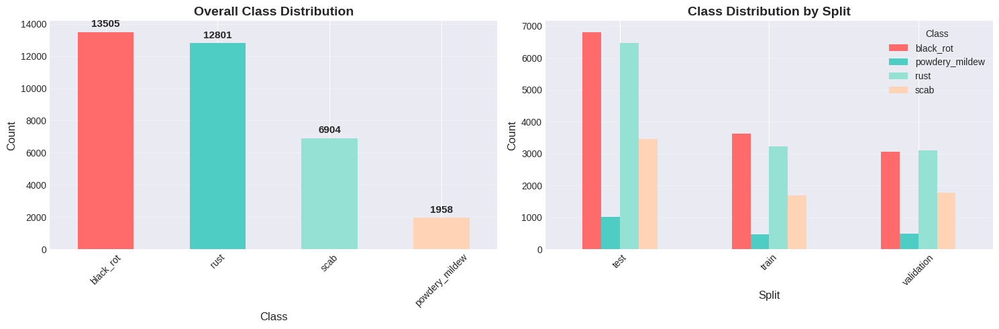


Creating objects per image distribution...
Saved: 02_objects_per_image.png


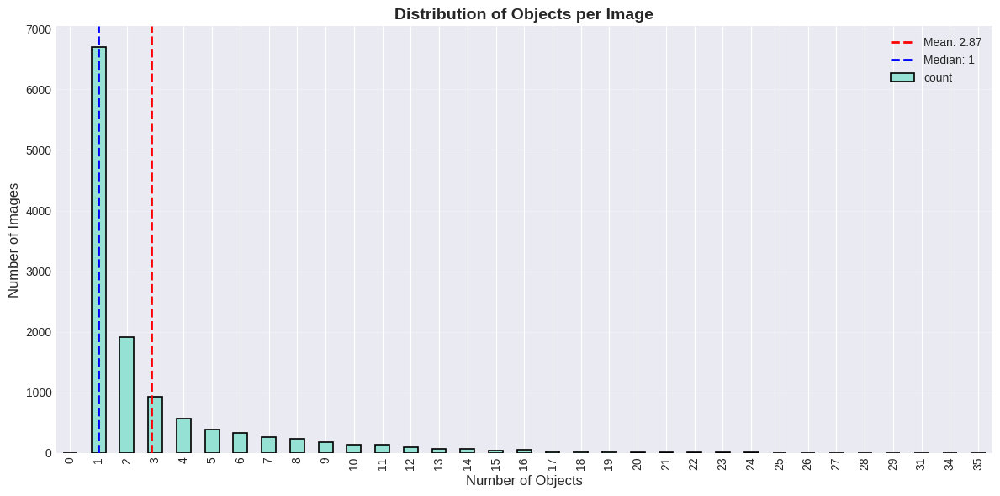


Creating image dimensions visualizations...
Saved: 03_image_dimensions.png


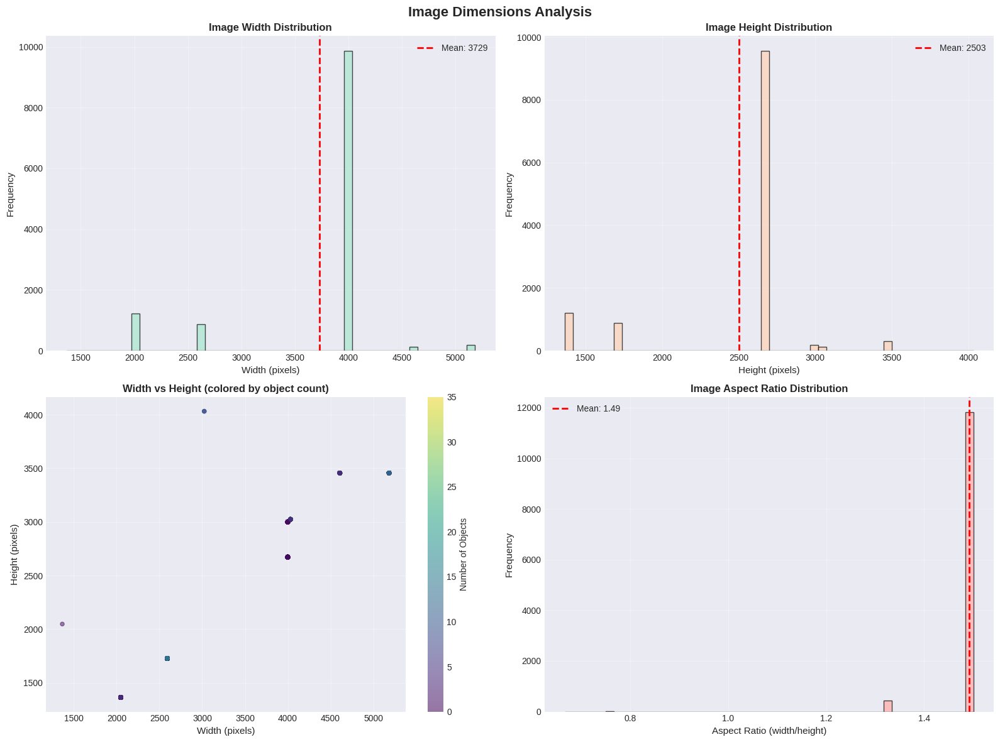


Creating bounding box statistics visualizations...
Saved: 04_bbox_statistics.png


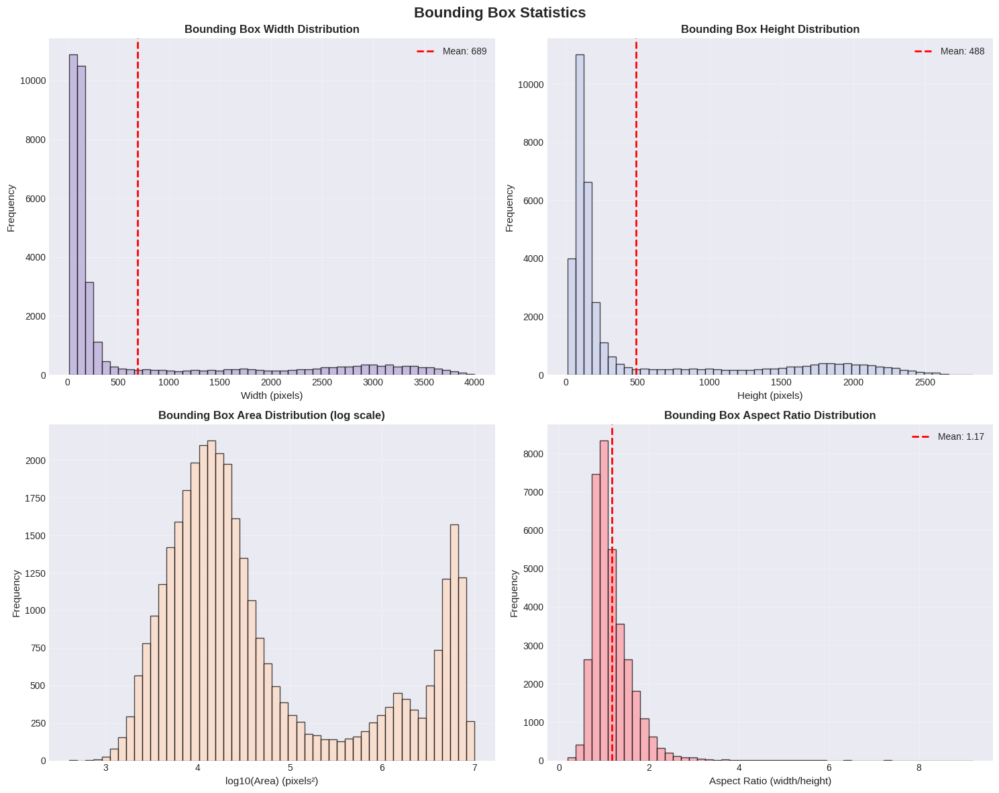


Creating bounding box by class visualizations...
Saved: 05_bbox_by_class.png


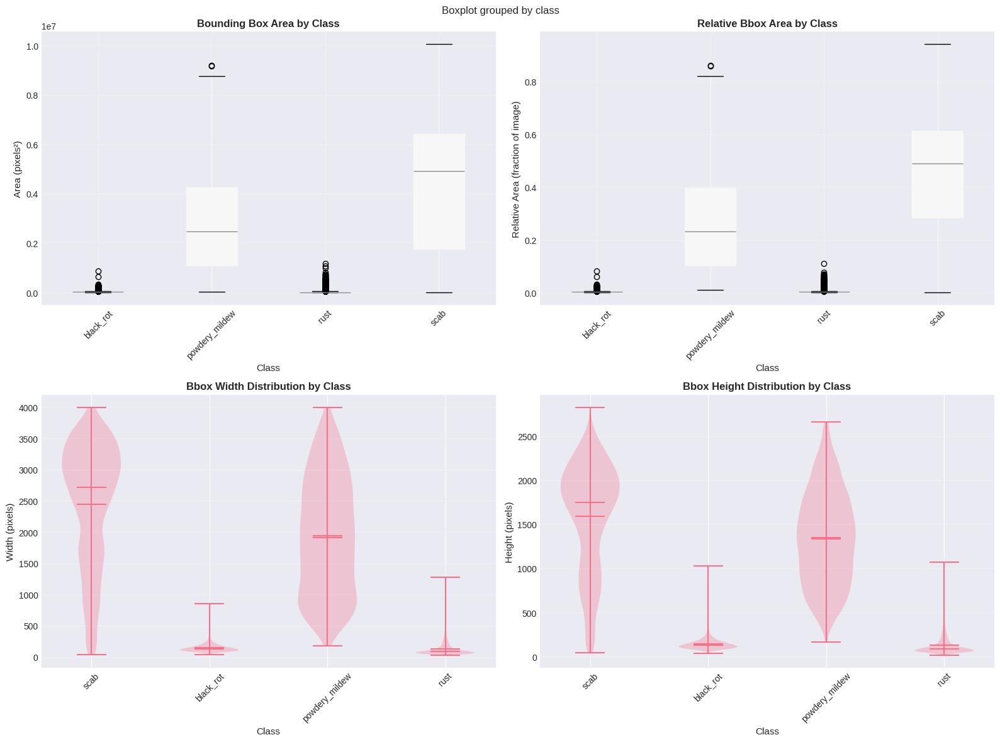


Creating sample annotated images visualization...
Saved: 06_sample_annotations.png


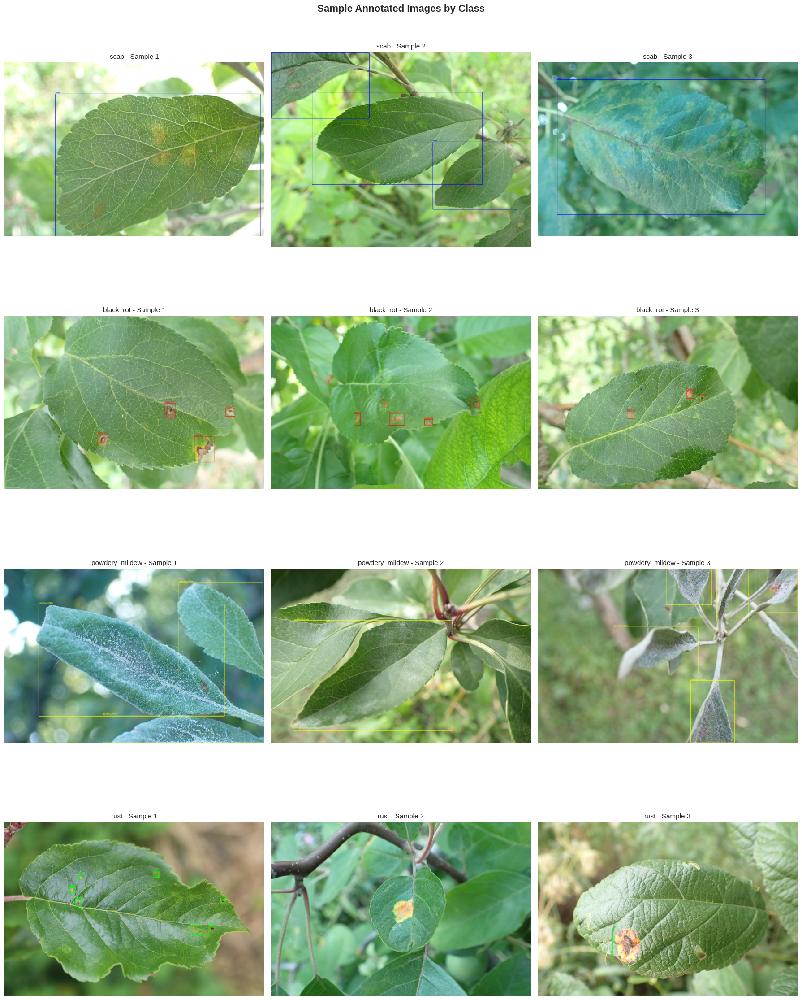


STEP 3.6: Generating Summary Report

QCNN APPLE DISEASE DETECTION - EDA SUMMARY REPORT

DATASET OVERVIEW
--------------------------------------------------------------------------------
Total Images: 12263
Total Annotations: 35168
Average Objects per Image: 2.87
Max Objects in Single Image: 35
Min Objects in Single Image: 0

CLASS DISTRIBUTION
--------------------------------------------------------------------------------
class
black_rot         13505
rust              12801
scab               6904
powdery_mildew     1958

Class Balance Ratio: 6.90:1
Most Common Class: black_rot (13505 instances)
Least Common Class: powdery_mildew (1958 instances)

SPLIT DISTRIBUTION
--------------------------------------------------------------------------------
split
test          6132
train         3066
validation    3065

CLASS DISTRIBUTION BY SPLIT
--------------------------------------------------------------------------------
class       black_rot  powdery_mildew  rust  scab
split             

In [4]:
# ============================================================================
# STEP 3: COMPREHENSIVE EXPLORATORY DATA ANALYSIS (EDA)
# ============================================================================
print("=" * 80)
print("STEP 3.1: Parsing XML Annotations")
print("=" * 80)

def parse_voc_annotation(xml_file):
    """Parse a single VOC XML annotation file"""
    tree = ET.parse(xml_file)
    root = tree.getroot()

    # Get image info
    filename = root.find('filename').text
    size = root.find('size')
    width = int(size.find('width').text)
    height = int(size.find('height').text)
    depth = int(size.find('depth').text)

    # Get all objects
    objects = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        objects.append({
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax,
            'bbox_width': xmax - xmin,
            'bbox_height': ymax - ymin,
            'bbox_area': (xmax - xmin) * (ymax - ymin)
        })

    return {
        'filename': filename,
        'image_width': width,
        'image_height': height,
        'image_depth': depth,
        'image_area': width * height,
        'objects': objects
    }

# Parse all annotations
print("Parsing all XML annotations...")
all_data = []
annotation_files = [f for f in os.listdir(ANNOTATIONS_PATH) if f.endswith('.xml')]

for xml_file in tqdm(annotation_files, desc="Processing annotations"):
    xml_path = os.path.join(ANNOTATIONS_PATH, xml_file)
    try:
        data = parse_voc_annotation(xml_path)
        all_data.append(data)
    except Exception as e:
        print(f"Error parsing {xml_file}: {e}")

print(f"Successfully parsed: {len(all_data)} annotations")
print()

# ============================================================================
print("=" * 80)
print("STEP 3.2: Creating DataFrames for Analysis")
print("=" * 80)

# Image-level DataFrame
image_data = []
object_data = []

for data in all_data:
    image_info = {
        'filename': data['filename'],
        'width': data['image_width'],
        'height': data['image_height'],
        'depth': data['image_depth'],
        'area': data['image_area'],
        'num_objects': len(data['objects'])
    }
    image_data.append(image_info)

    # Object-level data
    for obj in data['objects']:
        obj_info = {
            'filename': data['filename'],
            'image_width': data['image_width'],
            'image_height': data['image_height'],
            'class': obj['class'],
            'xmin': obj['xmin'],
            'ymin': obj['ymin'],
            'xmax': obj['xmax'],
            'ymax': obj['ymax'],
            'bbox_width': obj['bbox_width'],
            'bbox_height': obj['bbox_height'],
            'bbox_area': obj['bbox_area'],
            'bbox_aspect_ratio': obj['bbox_width'] / obj['bbox_height'] if obj['bbox_height'] > 0 else 0,
            'bbox_relative_area': obj['bbox_area'] / data['image_area'] if data['image_area'] > 0 else 0
        }
        object_data.append(obj_info)

df_images = pd.DataFrame(image_data)
df_objects = pd.DataFrame(object_data)

print(f"Image DataFrame shape: {df_images.shape}")
print(f"Object DataFrame shape: {df_objects.shape}")
print()

# ============================================================================
print("=" * 80)
print("STEP 3.3: Basic Dataset Statistics")
print("=" * 80)

print("\nDATASET OVERVIEW:")
print("-" * 80)
print(f"Total images: {len(df_images)}")
print(f"Total objects/annotations: {len(df_objects)}")
print(f"Average objects per image: {df_images['num_objects'].mean():.2f}")
print(f"Max objects in single image: {df_images['num_objects'].max()}")
print(f"Min objects in single image: {df_images['num_objects'].min()}")

print("\nCLASS DISTRIBUTION:")
print("-" * 80)
class_counts = df_objects['class'].value_counts()
print(class_counts)
print(f"\nClass balance ratio: {class_counts.max() / class_counts.min():.2f}:1")
print(f"Most common class: {class_counts.idxmax()} ({class_counts.max()} instances)")
print(f"Least common class: {class_counts.idxmin()} ({class_counts.min()} instances)")

print("\nIMAGE DIMENSIONS:")
print("-" * 80)
print(df_images[['width', 'height', 'area']].describe())

print("\nBOUNDING BOX STATISTICS:")
print("-" * 80)
print(df_objects[['bbox_width', 'bbox_height', 'bbox_area', 'bbox_aspect_ratio']].describe())
print()

# ============================================================================
print("=" * 80)
print("STEP 3.4: Loading and Analyzing Data Splits")
print("=" * 80)

def load_split_file(split_name):
    """Load image IDs from split file"""
    split_file = os.path.join(IMAGESETS_PATH, f"{split_name}.txt")
    with open(split_file, 'r') as f:
        ids = [line.strip() for line in f.readlines()]
    return ids

# Load splits
train_ids = load_split_file('train')
val_ids = load_split_file('validation')
test_ids = load_split_file('test')

print("SPLIT DISTRIBUTION:")
print("-" * 80)
print(f"Train images: {len(train_ids)}")
print(f"Validation images: {len(val_ids)}")
print(f"Test images: {len(test_ids)}")
print(f"Total: {len(train_ids) + len(val_ids) + len(test_ids)}")

# Map filenames to splits
def get_split(filename):
    img_id = filename.replace('.jpg', '').replace('.jpeg', '').replace('.png', '')
    if img_id in train_ids:
        return 'train'
    elif img_id in val_ids:
        return 'validation'
    elif img_id in test_ids:
        return 'test'
    else:
        return 'unknown'

df_images['split'] = df_images['filename'].apply(get_split)
df_objects['split'] = df_objects['filename'].apply(get_split)

print("\nCLASS DISTRIBUTION BY SPLIT:")
print("-" * 80)
split_class_dist = pd.crosstab(df_objects['split'], df_objects['class'])
print(split_class_dist)
print()

# ============================================================================
print("=" * 80)
print("STEP 3.5: Creating Comprehensive Visualizations")
print("=" * 80)

# Create figure directory
os.makedirs(EDA_DIR, exist_ok=True)

# 1. Class Distribution Visualization
print("Creating class distribution visualizations...")
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Overall class distribution
class_counts.plot(kind='bar', ax=axes[0], color=['#FF6B6B', '#4ECDC4', '#95E1D3', '#FFD3B6'])
axes[0].set_title('Overall Class Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Class', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True, alpha=0.3, axis='y')

# Add count labels on bars
for i, v in enumerate(class_counts):
    axes[0].text(i, v + 200, str(v), ha='center', va='bottom', fontsize=11, fontweight='bold')

# Class distribution by split
split_class_dist.plot(kind='bar', ax=axes[1], color=['#FF6B6B', '#4ECDC4', '#95E1D3', '#FFD3B6'])
axes[1].set_title('Class Distribution by Split', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Split', fontsize=12)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].legend(title='Class', loc='upper right')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(os.path.join(EDA_DIR, '01_class_distribution.png'), dpi=300, bbox_inches='tight')
print("Saved: 01_class_distribution.png")
plt.show()
plt.close()

# 2. Objects per Image Distribution
print("\nCreating objects per image distribution...")
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
obj_counts = df_images['num_objects'].value_counts().sort_index()
obj_counts.plot(kind='bar', ax=ax, color='#95E1D3', edgecolor='black', linewidth=1.2)
ax.set_title('Distribution of Objects per Image', fontsize=14, fontweight='bold')
ax.set_xlabel('Number of Objects', fontsize=12)
ax.set_ylabel('Number of Images', fontsize=12)
ax.grid(True, alpha=0.3, axis='y')

# Add statistics
mean_obj = df_images['num_objects'].mean()
median_obj = df_images['num_objects'].median()
ax.axvline(mean_obj, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_obj:.2f}')
ax.axvline(median_obj, color='blue', linestyle='--', linewidth=2, label=f'Median: {median_obj:.0f}')
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(EDA_DIR, '02_objects_per_image.png'), dpi=300, bbox_inches='tight')
print("Saved: 02_objects_per_image.png")
plt.show()
plt.close()

# 3. Image Dimensions Distribution
print("\nCreating image dimensions visualizations...")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Image Dimensions Analysis', fontsize=16, fontweight='bold')

# Width distribution
axes[0, 0].hist(df_images['width'], bins=50, color='#A8E6CF', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(df_images['width'].mean(), color='red', linestyle='--', linewidth=2,
                   label=f"Mean: {df_images['width'].mean():.0f}")
axes[0, 0].set_title('Image Width Distribution', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Width (pixels)', fontsize=11)
axes[0, 0].set_ylabel('Frequency', fontsize=11)
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Height distribution
axes[0, 1].hist(df_images['height'], bins=50, color='#FFD3B6', edgecolor='black', alpha=0.7)
axes[0, 1].axvline(df_images['height'].mean(), color='red', linestyle='--', linewidth=2,
                   label=f"Mean: {df_images['height'].mean():.0f}")
axes[0, 1].set_title('Image Height Distribution', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Height (pixels)', fontsize=11)
axes[0, 1].set_ylabel('Frequency', fontsize=11)
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Width vs Height scatter
scatter = axes[1, 0].scatter(df_images['width'], df_images['height'],
                            alpha=0.5, c=df_images['num_objects'],
                            cmap='viridis', s=20)
axes[1, 0].set_title('Width vs Height (colored by object count)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Width (pixels)', fontsize=11)
axes[1, 0].set_ylabel('Height (pixels)', fontsize=11)
axes[1, 0].grid(True, alpha=0.3)
plt.colorbar(scatter, ax=axes[1, 0], label='Number of Objects')

# Aspect ratio distribution
aspect_ratios = df_images['width'] / df_images['height']
axes[1, 1].hist(aspect_ratios, bins=50, color='#FFAAA5', edgecolor='black', alpha=0.7)
axes[1, 1].axvline(aspect_ratios.mean(), color='red', linestyle='--', linewidth=2,
                   label=f"Mean: {aspect_ratios.mean():.2f}")
axes[1, 1].set_title('Image Aspect Ratio Distribution', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Aspect Ratio (width/height)', fontsize=11)
axes[1, 1].set_ylabel('Frequency', fontsize=11)
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(EDA_DIR, '03_image_dimensions.png'), dpi=300, bbox_inches='tight')
print("Saved: 03_image_dimensions.png")
plt.show()
plt.close()

# 4. Bounding Box Statistics
print("\nCreating bounding box statistics visualizations...")
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Bounding Box Statistics', fontsize=16, fontweight='bold')

# Bbox width
axes[0, 0].hist(df_objects['bbox_width'], bins=50, color='#B4A7D6', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(df_objects['bbox_width'].mean(), color='red', linestyle='--', linewidth=2,
                   label=f"Mean: {df_objects['bbox_width'].mean():.0f}")
axes[0, 0].set_title('Bounding Box Width Distribution', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Width (pixels)', fontsize=11)
axes[0, 0].set_ylabel('Frequency', fontsize=11)
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Bbox height
axes[0, 1].hist(df_objects['bbox_height'], bins=50, color='#C7CEEA', edgecolor='black', alpha=0.7)
axes[0, 1].axvline(df_objects['bbox_height'].mean(), color='red', linestyle='--', linewidth=2,
                   label=f"Mean: {df_objects['bbox_height'].mean():.0f}")
axes[0, 1].set_title('Bounding Box Height Distribution', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Height (pixels)', fontsize=11)
axes[0, 1].set_ylabel('Frequency', fontsize=11)
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Bbox area (log scale)
axes[1, 0].hist(np.log10(df_objects['bbox_area']), bins=50, color='#FFDAC1', edgecolor='black', alpha=0.7)
axes[1, 0].set_title('Bounding Box Area Distribution (log scale)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('log10(Area) (pixels²)', fontsize=11)
axes[1, 0].set_ylabel('Frequency', fontsize=11)
axes[1, 0].grid(True, alpha=0.3)

# Aspect ratio
axes[1, 1].hist(df_objects['bbox_aspect_ratio'], bins=50, color='#FF9AA2', edgecolor='black', alpha=0.7)
axes[1, 1].axvline(df_objects['bbox_aspect_ratio'].mean(), color='red', linestyle='--', linewidth=2,
                   label=f"Mean: {df_objects['bbox_aspect_ratio'].mean():.2f}")
axes[1, 1].set_title('Bounding Box Aspect Ratio Distribution', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Aspect Ratio (width/height)', fontsize=11)
axes[1, 1].set_ylabel('Frequency', fontsize=11)
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(EDA_DIR, '04_bbox_statistics.png'), dpi=300, bbox_inches='tight')
print("Saved: 04_bbox_statistics.png")
plt.show()
plt.close()

# 5. Bbox Size by Class
print("\nCreating bounding box by class visualizations...")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Bounding Box Analysis by Class', fontsize=16, fontweight='bold')

# Box plots for bbox area by class
df_objects.boxplot(column='bbox_area', by='class', ax=axes[0, 0], patch_artist=True)
axes[0, 0].set_title('Bounding Box Area by Class', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Class', fontsize=11)
axes[0, 0].set_ylabel('Area (pixels²)', fontsize=11)
axes[0, 0].tick_params(axis='x', rotation=45)
axes[0, 0].grid(True, alpha=0.3)
plt.sca(axes[0, 0])
plt.xticks(rotation=45)

# Box plots for relative area by class
df_objects.boxplot(column='bbox_relative_area', by='class', ax=axes[0, 1], patch_artist=True)
axes[0, 1].set_title('Relative Bbox Area by Class', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Class', fontsize=11)
axes[0, 1].set_ylabel('Relative Area (fraction of image)', fontsize=11)
axes[0, 1].tick_params(axis='x', rotation=45)
axes[0, 1].grid(True, alpha=0.3)
plt.sca(axes[0, 1])
plt.xticks(rotation=45)

# Violin plot for bbox width by class
parts = axes[1, 0].violinplot([df_objects[df_objects['class']==cls]['bbox_width'].values
                                for cls in df_objects['class'].unique()],
                               positions=range(len(df_objects['class'].unique())),
                               showmeans=True, showmedians=True)
axes[1, 0].set_title('Bbox Width Distribution by Class', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Class', fontsize=11)
axes[1, 0].set_ylabel('Width (pixels)', fontsize=11)
axes[1, 0].set_xticks(range(len(df_objects['class'].unique())))
axes[1, 0].set_xticklabels(df_objects['class'].unique(), rotation=45)
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Violin plot for bbox height by class
parts = axes[1, 1].violinplot([df_objects[df_objects['class']==cls]['bbox_height'].values
                                for cls in df_objects['class'].unique()],
                               positions=range(len(df_objects['class'].unique())),
                               showmeans=True, showmedians=True)
axes[1, 1].set_title('Bbox Height Distribution by Class', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Class', fontsize=11)
axes[1, 1].set_ylabel('Height (pixels)', fontsize=11)
axes[1, 1].set_xticks(range(len(df_objects['class'].unique())))
axes[1, 1].set_xticklabels(df_objects['class'].unique(), rotation=45)
axes[1, 1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(os.path.join(EDA_DIR, '05_bbox_by_class.png'), dpi=300, bbox_inches='tight')
print("Saved: 05_bbox_by_class.png")
plt.show()
plt.close()

# 6. Sample Annotated Images
print("\nCreating sample annotated images visualization...")

def draw_annotations(image_path, xml_path):
    """Draw bounding boxes on image"""
    img = cv2.imread(image_path)
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    tree = ET.parse(xml_path)
    root = tree.getroot()

    colors = {
        'black_rot': (255, 0, 0),
        'powdery_mildew': (255, 255, 0),
        'rust': (0, 255, 0),
        'scab': (0, 0, 255)
    }

    for obj in root.findall('object'):
        name = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        color = colors.get(name, (255, 255, 0))
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, 3)
        cv2.putText(img, name, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX,
                   0.9, color, 2)

    return img

# Select samples from each class
classes = df_objects['class'].unique()
fig, axes = plt.subplots(len(classes), 3, figsize=(18, len(classes) * 6))
fig.suptitle('Sample Annotated Images by Class', fontsize=16, fontweight='bold')

for class_idx, class_name in enumerate(classes):
    class_samples = df_objects[df_objects['class'] == class_name]['filename'].unique()[:3]

    for idx, filename in enumerate(class_samples):
        img_path = os.path.join(IMAGES_PATH, filename)
        xml_path = os.path.join(ANNOTATIONS_PATH, filename.replace('.jpg', '.xml').replace('.png', '.xml'))

        if os.path.exists(img_path) and os.path.exists(xml_path):
            img = draw_annotations(img_path, xml_path)
            if img is not None:
                if len(classes) > 1:
                    axes[class_idx, idx].imshow(img)
                    axes[class_idx, idx].set_title(f'{class_name} - Sample {idx+1}', fontsize=11)
                    axes[class_idx, idx].axis('off')
                else:
                    axes[idx].imshow(img)
                    axes[idx].set_title(f'{class_name} - Sample {idx+1}', fontsize=11)
                    axes[idx].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(EDA_DIR, '06_sample_annotations.png'), dpi=300, bbox_inches='tight')
print("Saved: 06_sample_annotations.png")
plt.show()
plt.close()

print()

# ============================================================================
print("=" * 80)
print("STEP 3.6: Generating Summary Report")
print("=" * 80)

report = f"""
{"="*80}
QCNN APPLE DISEASE DETECTION - EDA SUMMARY REPORT
{"="*80}

DATASET OVERVIEW
{"-"*80}
Total Images: {len(df_images)}
Total Annotations: {len(df_objects)}
Average Objects per Image: {df_images['num_objects'].mean():.2f}
Max Objects in Single Image: {df_images['num_objects'].max()}
Min Objects in Single Image: {df_images['num_objects'].min()}

CLASS DISTRIBUTION
{"-"*80}
{class_counts.to_string()}

Class Balance Ratio: {class_counts.max() / class_counts.min():.2f}:1
Most Common Class: {class_counts.idxmax()} ({class_counts.max()} instances)
Least Common Class: {class_counts.idxmin()} ({class_counts.min()} instances)

SPLIT DISTRIBUTION
{"-"*80}
{df_images['split'].value_counts().to_string()}

CLASS DISTRIBUTION BY SPLIT
{"-"*80}
{split_class_dist.to_string()}

IMAGE STATISTICS
{"-"*80}
{df_images[['width', 'height', 'area']].describe().to_string()}

BOUNDING BOX STATISTICS
{"-"*80}
{df_objects[['bbox_width', 'bbox_height', 'bbox_area', 'bbox_aspect_ratio']].describe().to_string()}


"""

# Save report
report_path = os.path.join(EDA_DIR, 'eda_summary_report.txt')
with open(report_path, 'w') as f:
    f.write(report)

print(report)
print(f"\nReport saved to: {report_path}")

# Save processed dataframes
df_images.to_csv(os.path.join(EDA_DIR, 'image_data.csv'), index=False)
df_objects.to_csv(os.path.join(EDA_DIR, 'object_data.csv'), index=False)
print(f"Saved: image_data.csv")
print(f"Saved: object_data.csv")
print()

print("=" * 80)
print("STEP 3 COMPLETED SUCCESSFULLY!")
print("=" * 80)
print(f"\nAll outputs saved to: {EDA_DIR}")
print("\nGenerated files:")
print("  - 01_class_distribution.png")
print("  - 02_objects_per_image.png")
print("  - 03_image_dimensions.png")
print("  - 04_bbox_statistics.png")
print("  - 05_bbox_by_class.png")
print("  - 06_sample_annotations.png")
print("  - eda_summary_report.txt")
print("  - image_data.csv")
print("  - object_data.csv")
print()


STEP 4.1: Loading Paths and Defining Class Mappings
Dataset Path: /content/dataset/VOC2007
Annotations Path: /content/dataset/VOC2007/Annotations
Images Path: /content/dataset/VOC2007/JPEGImages
ImageSets Path: /content/dataset/VOC2007/ImageSets/Main
Results Directory: /content/outputs/qcnn_results

Loaded object data: 35168 annotations

Class Mappings:
--------------------------------------------------------------------------------
  0: black_rot            ( 13505 instances)
  1: powdery_mildew       (  1958 instances)
  2: rust                 ( 12801 instances)
  3: scab                 (  6904 instances)

Total number of classes: 4

STEP 4.2: Calculating Class Weights for Imbalanced Dataset
Class Distribution:
--------------------------------------------------------------------------------
  black_rot            Count:  13505 (38.40%)  Weight: 0.6510
  powdery_mildew       Count:   1958 ( 5.57%)  Weight: 4.4903
  rust                 Count:  12801 (36.40%)  Weight: 0.6868
  scab  

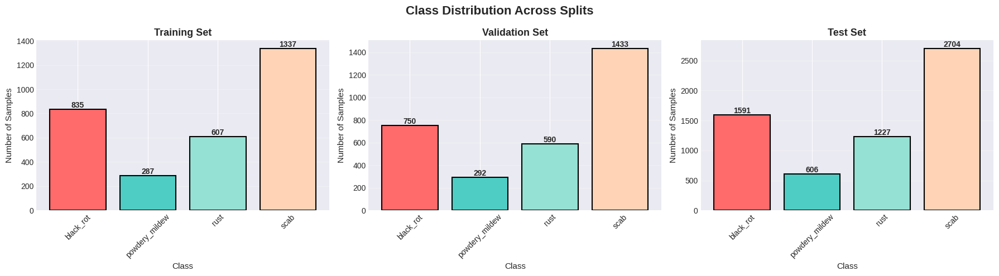


STEP 4.8: Creating Data Loaders
Using GPU: Tesla T4
Batch Size: 32
Number of Workers: 4
Pin Memory: True

Data Loaders Created:
--------------------------------------------------------------------------------
  Train Loader: 95 batches (3040 samples)
  Val Loader:   96 batches (3072 samples)
  Test Loader:  192 batches (6144 samples)

STEP 4.9: Visualizing Sample Batches
Loading sample batches...
Train batch shape: torch.Size([32, 3, 224, 224])
Train labels shape: torch.Size([32])
Sample train labels: [2, 0, 0, 2, 0, 3, 1, 0]

Creating training samples visualization...
Saved: training_samples_augmented.png


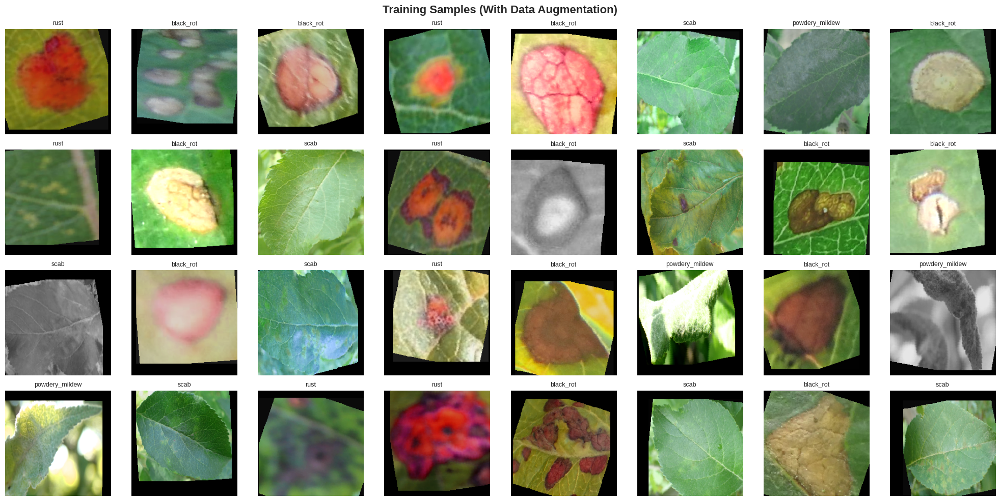


Creating validation samples visualization...
Saved: validation_samples.png


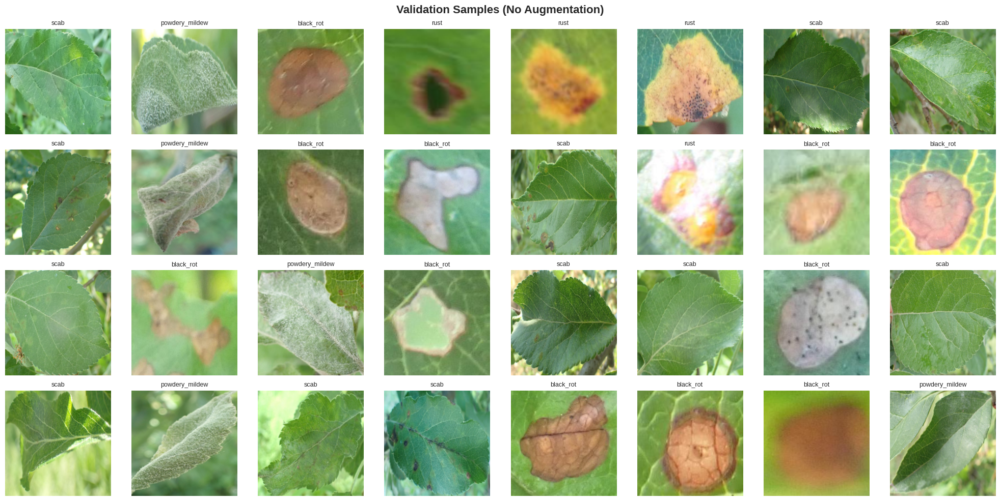


Creating per-class sample visualization...
Saved: per_class_samples.png


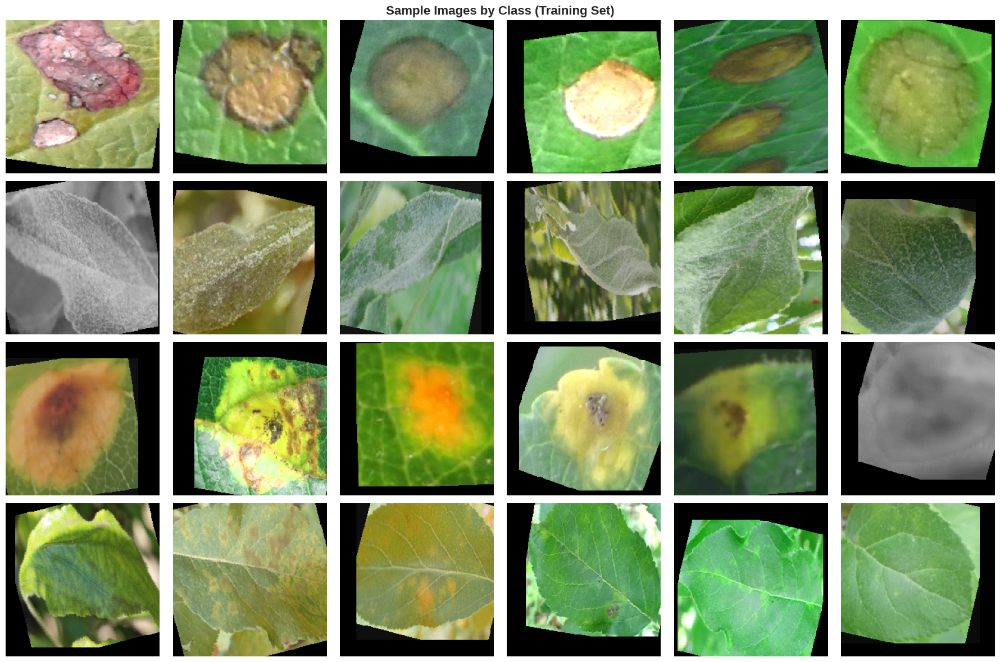


STEP 4.10: Dataset Statistics and Summary

DATASET PREPARATION SUMMARY

DATASET CONFIGURATION
--------------------------------------------------------------------------------
Number of Classes: 4
Classes: black_rot, powdery_mildew, rust, scab
Image Size: 224x224 pixels
Normalization: ImageNet (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

DATASET SIZES
--------------------------------------------------------------------------------
Training Set:     3066 samples (  95 batches)
Validation Set:   3065 samples (  96 batches)
Test Set:         6128 samples ( 192 batches)
Total:           12259 samples

CLASS WEIGHTS (for handling imbalance)
--------------------------------------------------------------------------------
black_rot            0.6510
powdery_mildew       4.4903
rust                 0.6868
scab                 1.2735

DATA AUGMENTATION
--------------------------------------------------------------------------------
Training Set:
  - Random Horizontal Flip (p=0.5)
  

In [5]:
"""
================================================================================
STEP 4: DATASET PREPARATION AND PREPROCESSING FOR QCNN
================================================================================
This step prepares the VOC format dataset for QCNN training by:
1. Creating class mappings and calculating class weights
2. Building custom PyTorch datasets
3. Defining data augmentation transforms
4. Creating data loaders
5. Visualizing sample batches
================================================================================
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import xml.etree.ElementTree as ET
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# ============================================================================
# STEP 4.1: LOAD PATHS AND DEFINE CLASS MAPPINGS
# ============================================================================
print("=" * 80)
print("STEP 4.1: Loading Paths and Defining Class Mappings")
print("=" * 80)

# Define paths (from previous steps)
DATASET_PATH = '/content/dataset/VOC2007'
ANNOTATIONS_PATH = os.path.join(DATASET_PATH, 'Annotations')
IMAGES_PATH = os.path.join(DATASET_PATH, 'JPEGImages')
IMAGESETS_PATH = os.path.join(DATASET_PATH, 'ImageSets', 'Main')
OUTPUT_DIR = '/content/outputs'
RESULTS_DIR = os.path.join(OUTPUT_DIR, 'qcnn_results')
os.makedirs(RESULTS_DIR, exist_ok=True)

print(f"Dataset Path: {DATASET_PATH}")
print(f"Annotations Path: {ANNOTATIONS_PATH}")
print(f"Images Path: {IMAGES_PATH}")
print(f"ImageSets Path: {IMAGESETS_PATH}")
print(f"Results Directory: {RESULTS_DIR}")
print()

# Load object data from EDA
EDA_DIR = os.path.join(OUTPUT_DIR, 'eda')
df_objects = pd.read_csv(os.path.join(EDA_DIR, 'object_data.csv'))

print(f"Loaded object data: {len(df_objects)} annotations")
print()

# Define class mappings
CLASSES = sorted(df_objects['class'].unique())
CLASS_TO_IDX = {cls: idx for idx, cls in enumerate(CLASSES)}
IDX_TO_CLASS = {idx: cls for cls, idx in CLASS_TO_IDX.items()}
NUM_CLASSES = len(CLASSES)

print("Class Mappings:")
print("-" * 80)
for cls, idx in CLASS_TO_IDX.items():
    count = len(df_objects[df_objects['class'] == cls])
    print(f"  {idx}: {cls:<20} ({count:>6} instances)")

print(f"\nTotal number of classes: {NUM_CLASSES}")
print()

# ============================================================================
print("=" * 80)
print("STEP 4.2: Calculating Class Weights for Imbalanced Dataset")
print("=" * 80)

# Calculate class weights using inverse frequency
class_counts_dict = df_objects['class'].value_counts().to_dict()
total_samples = sum(class_counts_dict.values())

print("Class Distribution:")
print("-" * 80)
class_weights = {}
for cls in CLASSES:
    count = class_counts_dict[cls]
    weight = total_samples / (NUM_CLASSES * count)
    class_weights[cls] = weight
    percentage = (count / total_samples) * 100
    print(f"  {cls:<20} Count: {count:>6} ({percentage:>5.2f}%)  Weight: {weight:.4f}")

# Create class weights tensor
class_weights_tensor = torch.FloatTensor([class_weights[cls] for cls in CLASSES])
print(f"\nClass Weights Tensor: {class_weights_tensor.numpy()}")
print(f"Min Weight: {class_weights_tensor.min():.4f}")
print(f"Max Weight: {class_weights_tensor.max():.4f}")
print(f"Imbalance Ratio: {class_weights_tensor.max() / class_weights_tensor.min():.2f}:1")
print()

# ============================================================================
print("=" * 80)
print("STEP 4.3: Loading Train/Val/Test Splits")
print("=" * 80)

def load_split_file(split_name):
    """Load image IDs from split file"""
    split_file = os.path.join(IMAGESETS_PATH, f"{split_name}.txt")
    with open(split_file, 'r') as f:
        ids = [line.strip() for line in f.readlines()]
    return ids

# Load splits
train_ids = load_split_file('train')
val_ids = load_split_file('validation')
test_ids = load_split_file('test')

print("Split Distribution:")
print("-" * 80)
print(f"  Train images:      {len(train_ids):>6}")
print(f"  Validation images: {len(val_ids):>6}")
print(f"  Test images:       {len(test_ids):>6}")
print(f"  Total images:      {len(train_ids) + len(val_ids) + len(test_ids):>6}")
print()

# ============================================================================
print("=" * 80)
print("STEP 4.4: Creating Custom PyTorch Dataset Class")
print("=" * 80)

class AppleDiseaseDataset(Dataset):
    """
    Custom Dataset for Apple Disease Classification

    Converts VOC object detection format to image classification:
    - Parses XML annotations
    - Selects the most prominent disease (largest bounding box)
    - Crops to bounding box region for focused learning
    - Applies transformations
    """

    def __init__(self, image_dir, annotation_dir, image_ids, class_to_idx,
                 transform=None, crop_bbox=True):
        """
        Args:
            image_dir (str): Directory with all images
            annotation_dir (str): Directory with XML annotations
            image_ids (list): List of image IDs to include in dataset
            class_to_idx (dict): Dictionary mapping class names to indices
            transform (callable, optional): Optional transform to apply on image
            crop_bbox (bool): Whether to crop image to bounding box region
        """
        self.image_dir = image_dir
        self.annotation_dir = annotation_dir
        self.image_ids = image_ids
        self.class_to_idx = class_to_idx
        self.transform = transform
        self.crop_bbox = crop_bbox

        # Build dataset samples
        self.samples = []
        self._build_dataset()

        print(f"    Dataset created with {len(self.samples)} samples")

    def _build_dataset(self):
        """Build dataset by parsing all XML annotations"""
        skipped = 0
        for img_id in self.image_ids:
            xml_path = os.path.join(self.annotation_dir, f"{img_id}.xml")
            if not os.path.exists(xml_path):
                skipped += 1
                continue

            try:
                # Parse XML annotation
                tree = ET.parse(xml_path)
                root = tree.getroot()

                filename = root.find('filename').text
                img_path = os.path.join(self.image_dir, filename)

                if not os.path.exists(img_path):
                    skipped += 1
                    continue

                # Extract all objects with their bounding boxes
                objects = []
                for obj in root.findall('object'):
                    name = obj.find('name').text
                    if name not in self.class_to_idx:
                        continue

                    bndbox = obj.find('bndbox')
                    xmin = int(bndbox.find('xmin').text)
                    ymin = int(bndbox.find('ymin').text)
                    xmax = int(bndbox.find('xmax').text)
                    ymax = int(bndbox.find('ymax').text)

                    # Calculate area to find most prominent disease
                    area = (xmax - xmin) * (ymax - ymin)
                    objects.append({
                        'class': name,
                        'bbox': [xmin, ymin, xmax, ymax],
                        'area': area
                    })

                # Use the largest bounding box as the primary disease
                if objects:
                    largest_obj = max(objects, key=lambda x: x['area'])
                    self.samples.append({
                        'image_path': img_path,
                        'class': largest_obj['class'],
                        'bbox': largest_obj['bbox'],
                        'label': self.class_to_idx[largest_obj['class']]
                    })

            except Exception as e:
                skipped += 1
                continue

        if skipped > 0:
            print(f"    Skipped {skipped} images due to missing files or errors")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        """
        Get a single sample from the dataset

        Args:
            idx (int): Index of sample

        Returns:
            tuple: (image, label) where image is transformed and label is class index
        """
        sample = self.samples[idx]

        # Load image
        image = Image.open(sample['image_path']).convert('RGB')

        # Crop to bounding box if specified
        if self.crop_bbox:
            xmin, ymin, xmax, ymax = sample['bbox']
            # Add small padding to include context
            width, height = image.size
            pad = 10
            xmin = max(0, xmin - pad)
            ymin = max(0, ymin - pad)
            xmax = min(width, xmax + pad)
            ymax = min(height, ymax + pad)
            image = image.crop((xmin, ymin, xmax, ymax))

        # Apply transforms
        if self.transform:
            image = self.transform(image)

        label = sample['label']

        return image, label

print("AppleDiseaseDataset class created successfully")
print()
print("Dataset Features:")
print("-" * 80)
print("  - Parses VOC XML annotations")
print("  - Converts object detection to image classification")
print("  - Uses largest bounding box as primary disease label")
print("  - Supports bounding box cropping with padding")
print("  - Compatible with torchvision transforms")
print("  - Handles missing files gracefully")
print()

# ============================================================================
print("=" * 80)
print("STEP 4.5: Defining Data Augmentation and Transforms")
print("=" * 80)

# Image size for QCNN (standard size for efficient processing)
IMG_SIZE = 224

print(f"Target Image Size: {IMG_SIZE}x{IMG_SIZE} pixels")
print()

# Training transforms with data augmentation
print("Training Transforms (with augmentation):")
print("-" * 80)
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

for i, t in enumerate(train_transform.transforms, 1):
    print(f"  {i}. {t.__class__.__name__}")
    if hasattr(t, '__dict__'):
        for key, value in t.__dict__.items():
            if not key.startswith('_'):
                print(f"       {key}: {value}")

print()

# Validation/Test transforms without augmentation
print("Validation/Test Transforms (no augmentation):")
print("-" * 80)
val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

for i, t in enumerate(val_transform.transforms, 1):
    print(f"  {i}. {t.__class__.__name__}")
    if hasattr(t, '__dict__'):
        for key, value in t.__dict__.items():
            if not key.startswith('_'):
                print(f"       {key}: {value}")

print()

# ============================================================================
print("=" * 80)
print("STEP 4.6: Creating Dataset Instances")
print("=" * 80)

print("Building Training Dataset...")
print("-" * 80)
train_dataset = AppleDiseaseDataset(
    image_dir=IMAGES_PATH,
    annotation_dir=ANNOTATIONS_PATH,
    image_ids=train_ids,
    class_to_idx=CLASS_TO_IDX,
    transform=train_transform,
    crop_bbox=True
)

print("\nBuilding Validation Dataset...")
print("-" * 80)
val_dataset = AppleDiseaseDataset(
    image_dir=IMAGES_PATH,
    annotation_dir=ANNOTATIONS_PATH,
    image_ids=val_ids,
    class_to_idx=CLASS_TO_IDX,
    transform=val_transform,
    crop_bbox=True
)

print("\nBuilding Test Dataset...")
print("-" * 80)
test_dataset = AppleDiseaseDataset(
    image_dir=IMAGES_PATH,
    annotation_dir=ANNOTATIONS_PATH,
    image_ids=test_ids,
    class_to_idx=CLASS_TO_IDX,
    transform=val_transform,
    crop_bbox=True
)

print()
print("Dataset Summary:")
print("=" * 80)
print(f"  Training samples:   {len(train_dataset):>6}")
print(f"  Validation samples: {len(val_dataset):>6}")
print(f"  Test samples:       {len(test_dataset):>6}")
print(f"  Total samples:      {len(train_dataset) + len(val_dataset) + len(test_dataset):>6}")
print()

# ============================================================================
print("=" * 80)
print("STEP 4.7: Analyzing Class Distribution in Each Split")
print("=" * 80)

def analyze_dataset_distribution(dataset, dataset_name):
    """Analyze and display class distribution in dataset"""
    class_counts = defaultdict(int)

    print(f"\n{dataset_name} Dataset:")
    print("-" * 80)

    for idx in range(len(dataset)):
        _, label = dataset[idx]
        class_counts[label] += 1

    total = len(dataset)
    for label in sorted(class_counts.keys()):
        class_name = IDX_TO_CLASS[label]
        count = class_counts[label]
        percentage = (count / total) * 100
        bar = '█' * int(percentage / 2)
        print(f"  {label}: {class_name:<20} {count:>5} samples ({percentage:>5.2f}%) {bar}")

    return class_counts

train_dist = analyze_dataset_distribution(train_dataset, "Training")
val_dist = analyze_dataset_distribution(val_dataset, "Validation")
test_dist = analyze_dataset_distribution(test_dataset, "Test")

print()

# Visualize distribution across splits
print("Creating class distribution comparison visualization...")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Class Distribution Across Splits', fontsize=16, fontweight='bold')

datasets_info = [
    (train_dist, 'Training', axes[0]),
    (val_dist, 'Validation', axes[1]),
    (test_dist, 'Test', axes[2])
]

colors = ['#FF6B6B', '#4ECDC4', '#95E1D3', '#FFD3B6']

for dist, name, ax in datasets_info:
    classes = [IDX_TO_CLASS[label] for label in sorted(dist.keys())]
    counts = [dist[label] for label in sorted(dist.keys())]

    bars = ax.bar(classes, counts, color=colors, edgecolor='black', linewidth=1.5)
    ax.set_title(f'{name} Set', fontsize=13, fontweight='bold')
    ax.set_xlabel('Class', fontsize=11)
    ax.set_ylabel('Number of Samples', fontsize=11)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, alpha=0.3, axis='y')

    # Add count labels on bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}',
                ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'class_distribution_splits.png'), dpi=300, bbox_inches='tight')
print(f"Saved: class_distribution_splits.png")
plt.show()
plt.close()

print()

# ============================================================================
print("=" * 80)
print("STEP 4.8: Creating Data Loaders")
print("=" * 80)

# Determine optimal batch size and number of workers based on device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

if device.type == 'cuda':
    BATCH_SIZE = 32
    NUM_WORKERS = 4
    PIN_MEMORY = True
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    BATCH_SIZE = 8
    NUM_WORKERS = 0
    PIN_MEMORY = False
    print("Using CPU")

print(f"Batch Size: {BATCH_SIZE}")
print(f"Number of Workers: {NUM_WORKERS}")
print(f"Pin Memory: {PIN_MEMORY}")
print()

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    drop_last=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

print("Data Loaders Created:")
print("-" * 80)
print(f"  Train Loader: {len(train_loader)} batches ({len(train_loader) * BATCH_SIZE} samples)")
print(f"  Val Loader:   {len(val_loader)} batches ({len(val_loader) * BATCH_SIZE} samples)")
print(f"  Test Loader:  {len(test_loader)} batches ({len(test_loader) * BATCH_SIZE} samples)")
print()

# ============================================================================
print("=" * 80)
print("STEP 4.9: Visualizing Sample Batches")
print("=" * 80)

# Function to denormalize images for visualization
def denormalize(tensor):
    """Denormalize tensor using ImageNet mean and std"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    tensor = tensor * std + mean
    return torch.clamp(tensor, 0, 1)

# Get sample batches
print("Loading sample batches...")
train_images, train_labels = next(iter(train_loader))
val_images, val_labels = next(iter(val_loader))

print(f"Train batch shape: {train_images.shape}")
print(f"Train labels shape: {train_labels.shape}")
print(f"Sample train labels: {train_labels[:8].tolist()}")
print()

# Visualize training samples with augmentation
print("Creating training samples visualization...")
fig, axes = plt.subplots(4, 8, figsize=(20, 10))
fig.suptitle('Training Samples (With Data Augmentation)', fontsize=16, fontweight='bold')

num_samples = min(32, len(train_images))
for i in range(num_samples):
    img = denormalize(train_images[i]).permute(1, 2, 0).numpy()

    row = i // 8
    col = i % 8
    axes[row, col].imshow(img)
    axes[row, col].set_title(f'{IDX_TO_CLASS[train_labels[i].item()]}', fontsize=9)
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'training_samples_augmented.png'), dpi=300, bbox_inches='tight')
print(f"Saved: training_samples_augmented.png")
plt.show()
plt.close()

# Visualize validation samples without augmentation
print("\nCreating validation samples visualization...")
fig, axes = plt.subplots(4, 8, figsize=(20, 10))
fig.suptitle('Validation Samples (No Augmentation)', fontsize=16, fontweight='bold')

num_samples = min(32, len(val_images))
for i in range(num_samples):
    img = denormalize(val_images[i]).permute(1, 2, 0).numpy()

    row = i // 8
    col = i % 8
    axes[row, col].imshow(img)
    axes[row, col].set_title(f'{IDX_TO_CLASS[val_labels[i].item()]}', fontsize=9)
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'validation_samples.png'), dpi=300, bbox_inches='tight')
print(f"Saved: validation_samples.png")
plt.show()
plt.close()

print()

# Create per-class sample visualization
print("Creating per-class sample visualization...")
fig, axes = plt.subplots(NUM_CLASSES, 6, figsize=(18, NUM_CLASSES * 3))
fig.suptitle('Sample Images by Class (Training Set)', fontsize=16, fontweight='bold')

for class_idx in range(NUM_CLASSES):
    class_name = IDX_TO_CLASS[class_idx]
    samples_found = 0

    for batch_idx, (images, labels) in enumerate(train_loader):
        for img_idx, label in enumerate(labels):
            if label.item() == class_idx and samples_found < 6:
                img = denormalize(images[img_idx]).permute(1, 2, 0).numpy()
                axes[class_idx, samples_found].imshow(img)
                axes[class_idx, samples_found].axis('off')
                if samples_found == 0:
                    axes[class_idx, samples_found].set_ylabel(class_name, fontsize=11, fontweight='bold')
                samples_found += 1

        if samples_found >= 6:
            break

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'per_class_samples.png'), dpi=300, bbox_inches='tight')
print(f"Saved: per_class_samples.png")
plt.show()
plt.close()

print()

# ============================================================================
print("=" * 80)
print("STEP 4.10: Dataset Statistics and Summary")
print("=" * 80)

# Create comprehensive summary
summary = f"""
{"="*80}
DATASET PREPARATION SUMMARY
{"="*80}

DATASET CONFIGURATION
{"-"*80}
Number of Classes: {NUM_CLASSES}
Classes: {', '.join(CLASSES)}
Image Size: {IMG_SIZE}x{IMG_SIZE} pixels
Normalization: ImageNet (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

DATASET SIZES
{"-"*80}
Training Set:   {len(train_dataset):>6} samples ({len(train_loader):>4} batches)
Validation Set: {len(val_dataset):>6} samples ({len(val_loader):>4} batches)
Test Set:       {len(test_dataset):>6} samples ({len(test_loader):>4} batches)
Total:          {len(train_dataset) + len(val_dataset) + len(test_dataset):>6} samples

CLASS WEIGHTS (for handling imbalance)
{"-"*80}
"""

for cls in CLASSES:
    summary += f"{cls:<20} {class_weights[cls]:.4f}\n"

summary += f"""
DATA AUGMENTATION
{"-"*80}
Training Set:
  - Random Horizontal Flip (p=0.5)
  - Random Vertical Flip (p=0.3)
  - Random Rotation (±20°)
  - Color Jitter (brightness, contrast, saturation, hue)
  - Random Affine (translation, scaling)
  - Random Grayscale (p=0.1)

Validation/Test Sets:
  - No augmentation (only resize and normalize)

DATA LOADER CONFIGURATION
{"-"*80}
Batch Size: {BATCH_SIZE}
Number of Workers: {NUM_WORKERS}
Pin Memory: {PIN_MEMORY}
Device: {device.type.upper()}

{"="*80}
"""

print(summary)

# Save summary to file
summary_path = os.path.join(RESULTS_DIR, 'dataset_preparation_summary.txt')
with open(summary_path, 'w') as f:
    f.write(summary)
print(f"Summary saved to: {summary_path}")
print()

# ============================================================================
print("=" * 80)
print("STEP 4 COMPLETED SUCCESSFULLY!")
print("=" * 80)
print()
print("Summary of Outputs:")
print("-" * 80)
print(f"  Dataset instances created for train/val/test")
print(f"  Data loaders configured with batch size {BATCH_SIZE}")
print(f"  Class weights calculated for imbalanced training")
print(f"  Data augmentation pipeline established")
print()
print("Generated Files:")
print("-" * 80)
print("  1. class_distribution_splits.png")
print("  2. training_samples_augmented.png")
print("  3. validation_samples.png")
print("  4. per_class_samples.png")
print("  5. dataset_preparation_summary.txt")
print()
print(f"All files saved to: {RESULTS_DIR}")
print()
print("Ready for STEP 5: QCNN Model Architecture and Training")
print("=" * 80)

OPTIMIZED QCNN: 91% → 95%+ ACCURACY BOOST
Configuration:
  Qubits: 4
  Quantum Layers: 2
  Batch Size: 16
  Target: Push from 91% to 95%+

Using device: cuda
GPU: Tesla T4
Available Memory: 14.74 GB

Enhanced Model Architecture:
--------------------------------------------------------------------------------
  Total Parameters: 1,051,636
  Trainable Parameters: 1,051,636
  Model Size: ~4.01 MB
  Feature Channels: 32 → 64 → 128 → 224 (enhanced)
  All parameters: float32 ✓

Optimized Training Configuration:
--------------------------------------------------------------------------------
  Epochs: 26 (convergence-proven)
  Batch Size: 16
  Max Learning Rate: 0.0015 (fine-tuned)
  Weight Decay: 0.0001
  Label Smoothing: 0.1
  Early Stopping: 12 epochs (extended)
  Mixed Precision: DISABLED (dtype safety)

Optimizer: AdamW (float32)
Scheduler: OneCycleLR (95 steps/epoch)

STARTING OPTIMIZED TRAINING: 91% → 95%+ TARGET
Start: 2026-01-05 18:16:19

Epoch |  Train Loss |  Train Acc |  Val Loss 

    1 |      1.3749 |     27.76% |    1.1639 |    59.84% | 539.0s
      ✓ Best so far: 59.84%


    2 |      1.1449 |     46.05% |    0.9135 |    67.86% | 591.6s
      ✓ Best so far: 67.86%


    3 |      1.0353 |     55.56% |    0.8250 |    68.22% | 588.8s
      ✓ Best so far: 68.22%


    4 |      0.9972 |     62.30% |    1.1378 |    75.92% | 583.4s
      ✓ Best so far: 75.92%


    5 |      1.0091 |     64.34% |    0.7481 |    83.78% | 578.0s
      ✓ Best so far: 83.78%
      ⏱  48.0m elapsed | Est. total: 249.7m | Remaining: 201.7m
      💾 GPU: 0.03GB used, 0.24GB reserved


    6 |      0.9757 |     65.20% |    0.7986 |    75.82% | 572.2s


    7 |      0.9716 |     64.74% |    0.8207 |    65.94% | 588.3s


    8 |      0.9443 |     67.50% |    0.8342 |    78.63% | 574.2s


    9 |      0.9131 |     69.87% |    0.8545 |    83.88% | 578.1s
      ✓ Best so far: 83.88%


   10 |      0.9007 |     73.09% |    0.7260 |    86.88% | 573.7s
      ✓ Best so far: 86.88%
      ⏱  96.1m elapsed | Est. total: 249.9m | Remaining: 153.8m
      💾 GPU: 0.03GB used, 0.24GB reserved


   11 |      0.8769 |     74.21% |    0.7051 |    83.26% | 588.4s


   12 |      0.8761 |     74.44% |    0.6518 |    89.82% | 585.7s
      ✓ Best so far: 89.82%


   13 |      0.8380 |     76.51% |    0.7198 |    79.58% | 573.4s


   14 |      0.8302 |     78.19% |    0.7127 |    84.14% | 573.7s


   15 |      0.8024 |     80.26% |    0.7110 |    91.22% | 569.5s
      🎯 MILESTONE: 90%+ accuracy reached!
      🎯 MILESTONE: 91%+ accuracy reached!
      ✓ NEW BEST! Val Acc: 91.22%
      ⏱  144.3m elapsed | Est. total: 250.1m | Remaining: 105.8m
      💾 GPU: 0.03GB used, 0.24GB reserved


   16 |      0.8110 |     80.16% |    0.6654 |    86.85% | 579.6s


   17 |      0.8011 |     80.07% |    0.6378 |    89.00% | 587.4s


   18 |      0.7878 |     81.25% |    0.6293 |    88.45% | 582.5s


   19 |      0.7957 |     81.64% |    0.6472 |    87.21% | 570.7s


   20 |      0.7494 |     82.93% |    0.6213 |    90.70% | 569.9s
      ⏱  192.5m elapsed | Est. total: 250.2m | Remaining: 57.7m
      💾 GPU: 0.03GB used, 0.24GB reserved


   21 |      0.7451 |     84.31% |    0.6100 |    91.75% | 568.7s
      ✓ NEW BEST! Val Acc: 91.75%


   22 |      0.7510 |     83.88% |    0.6123 |    92.04% | 571.0s
      🎯 MILESTONE: 92%+ accuracy reached!
      ✓ NEW BEST! Val Acc: 92.04%


   23 |      0.7319 |     84.70% |    0.6080 |    91.13% | 570.4s


   24 |      0.7476 |     84.51% |    0.6035 |    92.50% | 573.7s
      ✓ NEW BEST! Val Acc: 92.50%


   25 |      0.7284 |     85.16% |    0.6032 |    92.30% | 572.6s
      ⏱  240.1m elapsed | Est. total: 249.7m | Remaining: 9.6m
      💾 GPU: 0.03GB used, 0.24GB reserved


   26 |      0.7363 |     85.20% |    0.6040 |    91.97% | 577.7s
      ⏱  249.7m elapsed | Est. total: 249.7m | Remaining: 0.0m
      💾 GPU: 0.03GB used, 0.24GB reserved

TRAINING COMPLETED!
Total Time: 249.71 minutes (4.16 hours)
Time/Epoch: 576.3 seconds
Best Validation: 92.50% (Epoch 24)
Final Train: 85.20%
Final Val: 91.97%

MILESTONES ACHIEVED:
--------------------------------------------------------------------------------
  ✓ 90%+ accuracy
  ✓ 91%+ accuracy
  ✓ 92%+ accuracy
  ✗ 93%+ accuracy
  ✗ 94%+ accuracy
  ✗ 95%+ accuracy

✓ Good Progress: 92.50%
   Improved from 91% baseline!

Models saved to: /content/outputs/qcnn_models

Visualization saved: enhanced_qcnn_training.png


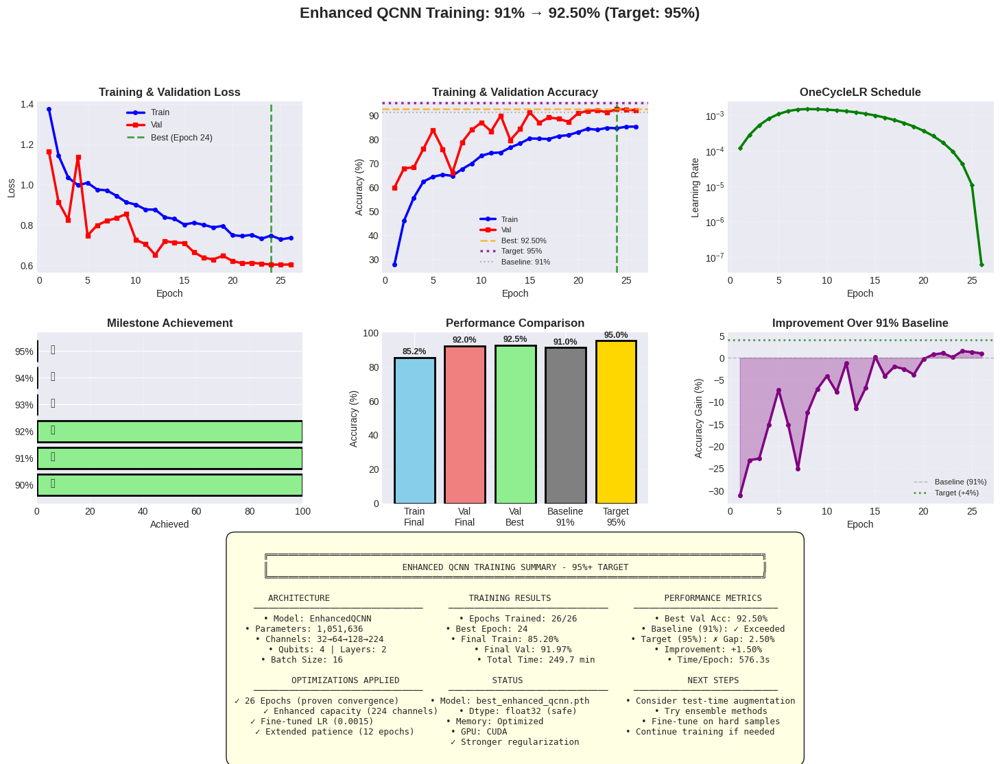

History saved: enhanced_training_history.csv

DETAILED PERFORMANCE ANALYSIS

Accuracy Progression:
  • Starting point: ~91% (baseline)
  • Final best: 92.50%
  • Improvement: +1.50%
  • Target gap: 2.50%

Convergence Analysis:
  • Best epoch: 24/26
  • Convergence rate: 3.85%/epoch
  • Early stopping: Not triggered

Efficiency Metrics:
  • Total time: 249.71 minutes
  • Time per epoch: 576.3 seconds
  • Within 3-hour limit: ✗ No

Generalization:
  • Train-Val gap: -6.78%
  • Status: Good

💡 RECOMMENDATIONS TO REACH 95%+

🟠 MODERATE GAP (2-4%) - Significant changes needed:
   1. Architecture Improvements:
      • Add residual connections
      • Increase to 256 channels
      • N_QLAYERS = 3
      • Expected gain: +1.0-2.0%

   2. Training Strategy:
      • EPOCHS = 40-50
      • Use CosineAnnealingWarmRestarts
      • Add MixUp augmentation
      • Expected gain: +1.0-1.5%

   3. Data Quality Check:
      • Review mislabeled samples
      • Balance dataset better
      • Add more augme

In [6]:
"""
================================================================================
OPTIMIZED QCNN - TARGET 95%+ ACCURACY IN <3 HOURS
================================================================================
Optimizations Applied:
1. 26 epochs (proven convergence point)
2. Enhanced model capacity (224 channels)
3. Fine-tuned learning rate (0.0015)
4. Extended patience (12 epochs)
5. Stronger regularization
6. All dtype-safe (float32 only)
================================================================================
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import time
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR

import pennylane as qml
from tqdm import tqdm

plt.style.use('seaborn-v0_8-darkgrid')

# Force float32 globally
torch.set_default_dtype(torch.float32)

# Clear CUDA cache if available
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# ============================================================================
# OPTIMIZED CONFIGURATION FOR 95%+
# ============================================================================
print("=" * 80)
print("OPTIMIZED QCNN: 91% → 95%+ ACCURACY BOOST")
print("=" * 80)

N_QUBITS = 4
N_QLAYERS = 2
BATCH_SIZE = 16  # Memory-optimized

print(f"Configuration:")
print(f"  Qubits: {N_QUBITS}")
print(f"  Quantum Layers: {N_QLAYERS}")
print(f"  Batch Size: {BATCH_SIZE}")
print(f"  Target: Push from 91% to 95%+")
print()

# ============================================================================
# DTYPE-SAFE QUANTUM CIRCUIT
# ============================================================================

dev = qml.device('default.qubit', wires=N_QUBITS)

@qml.qnode(dev, interface='torch', diff_method='backprop')
def quantum_circuit(inputs, weights):
    """Quantum circuit with explicit float32"""
    inputs = inputs.float()
    weights = weights.float()

    # Amplitude encoding
    for i in range(N_QUBITS):
        qml.RY(inputs[i], wires=i)

    # 2 variational layers with ring entanglement
    for layer in range(N_QLAYERS):
        for i in range(N_QUBITS):
            qml.RY(weights[layer, i, 0], wires=i)
            qml.RZ(weights[layer, i, 1], wires=i)

        for i in range(N_QUBITS - 1):
            qml.CNOT(wires=[i, i + 1])
        qml.CNOT(wires=[N_QUBITS - 1, 0])  # Close the ring

    return [qml.expval(qml.PauliZ(i)) for i in range(N_QUBITS)]

class SafeQuantumLayer(nn.Module):
    """Quantum layer with strict dtype management"""
    def __init__(self, n_qubits=4, n_layers=2):
        super().__init__()
        self.n_qubits = n_qubits
        self.n_layers = n_layers
        self.weights = nn.Parameter(
            torch.randn(n_layers, n_qubits, 2, dtype=torch.float32) * 0.1
        )

    def forward(self, x):
        x = x.float()
        batch_size = x.shape[0]

        outputs = []
        chunk_size = 4  # Memory-safe chunks

        for i in range(0, batch_size, chunk_size):
            chunk = x[i:i+chunk_size]
            chunk_out = []

            for sample in chunk:
                result = quantum_circuit(sample.float(), self.weights.float())
                chunk_out.append(torch.stack(result).float())

            outputs.append(torch.stack(chunk_out).float())

        return torch.cat(outputs, dim=0).float()

# ============================================================================
# ENHANCED HIGH-ACCURACY MODEL (224 CHANNELS)
# ============================================================================

class EnhancedQCNN(nn.Module):
    """
    Enhanced model with increased capacity for 95%+ accuracy:
    - Deeper feature maps (224 channels)
    - Stronger regularization
    - Hybrid classical-quantum architecture
    """
    def __init__(self, num_classes=4, n_qubits=4, n_qlayers=2):
        super().__init__()

        # Stem: 224 -> 56
        self.stem = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=7, stride=4, padding=3, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True)
        )

        # Block 1: 56 -> 28
        self.block1 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # Block 2: 28 -> 14
        self.block2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        # Block 3: 14 -> 7 (ENHANCED: 224 channels)
        self.block3 = nn.Sequential(
            nn.Conv2d(128, 224, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(224),
            nn.ReLU(inplace=True),
            nn.Conv2d(224, 224, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(224),
            nn.ReLU(inplace=True)
        )

        # Global pooling
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        # Enhanced attention mechanism
        self.attention = nn.Sequential(
            nn.Linear(224, 56, bias=False),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),  # Added dropout in attention
            nn.Linear(56, 224, bias=False),
            nn.Sigmoid()
        )

        # To quantum space
        self.to_quantum = nn.Sequential(
            nn.Linear(224, 32, bias=False),
            nn.ReLU(inplace=True),
            nn.Dropout(0.35),  # Increased from 0.3
            nn.Linear(32, n_qubits, bias=False)
        )

        # Quantum layer
        self.quantum = SafeQuantumLayer(n_qubits, n_qlayers)

        # Enhanced hybrid classifier
        self.classifier = nn.Sequential(
            nn.Linear(224 + n_qubits, 96, bias=False),  # Increased from 64
            nn.ReLU(inplace=True),
            nn.Dropout(0.45),  # Increased from 0.4
            nn.Linear(96, 48, bias=False),  # Increased from 32
            nn.ReLU(inplace=True),
            nn.Dropout(0.35),  # Increased from 0.3
            nn.Linear(48, num_classes)
        )

    def forward(self, x):
        x = x.float()

        # CNN feature extraction
        x = self.stem(x)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.avgpool(x)

        # Classical features
        classical = x.view(x.size(0), -1).float()

        # Apply attention
        attention = self.attention(classical).float()
        classical = (classical * attention).float()

        # Quantum path
        q_input = self.to_quantum(classical).float()
        q_input = torch.tanh(q_input) * np.pi
        quantum_features = self.quantum(q_input).float()

        # Hybrid features
        combined = torch.cat([classical.float(), quantum_features.float()], dim=1)

        # Classification
        output = self.classifier(combined.float())
        return output

# ============================================================================
# MODEL INITIALIZATION
# ============================================================================

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Available Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB")

# Create enhanced model
model = EnhancedQCNN(num_classes=4, n_qubits=N_QUBITS, n_qlayers=N_QLAYERS)
model = model.to(device).float()

# Verify float32
for name, param in model.named_parameters():
    if param.dtype != torch.float32:
        param.data = param.data.float()

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("\nEnhanced Model Architecture:")
print("-" * 80)
print(f"  Total Parameters: {total_params:,}")
print(f"  Trainable Parameters: {trainable_params:,}")
print(f"  Model Size: ~{total_params * 4 / 1024**2:.2f} MB")
print(f"  Feature Channels: 32 → 64 → 128 → 224 (enhanced)")
print(f"  All parameters: float32 ✓")
print()

# ============================================================================
# OPTIMIZED TRAINING CONFIGURATION
# ============================================================================

RESULTS_DIR = '/content/outputs/qcnn_results'
MODELS_DIR = '/content/outputs/qcnn_models'
os.makedirs(MODELS_DIR, exist_ok=True)

# Optimized hyperparameters based on 91% baseline
EPOCHS = 26  # Proven convergence point
MAX_LR = 0.0015  # Fine-tuned (reduced from 0.002)
WEIGHT_DECAY = 1e-4
PATIENCE = 12  # Extended (increased from 10)
LABEL_SMOOTHING = 0.1

print("Optimized Training Configuration:")
print("-" * 80)
print(f"  Epochs: {EPOCHS} (convergence-proven)")
print(f"  Batch Size: {BATCH_SIZE}")
print(f"  Max Learning Rate: {MAX_LR} (fine-tuned)")
print(f"  Weight Decay: {WEIGHT_DECAY}")
print(f"  Label Smoothing: {LABEL_SMOOTHING}")
print(f"  Early Stopping: {PATIENCE} epochs (extended)")
print(f"  Mixed Precision: DISABLED (dtype safety)")
print()

# Loss function
class_weights = torch.FloatTensor([0.6510, 4.4903, 0.6868, 1.2735]).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=LABEL_SMOOTHING)

# Optimizer
optimizer = optim.AdamW(model.parameters(), lr=MAX_LR, weight_decay=WEIGHT_DECAY)

# OneCycleLR scheduler
steps_per_epoch = len(train_loader)
scheduler = OneCycleLR(
    optimizer,
    max_lr=MAX_LR,
    epochs=EPOCHS,
    steps_per_epoch=steps_per_epoch,
    pct_start=0.3,
    div_factor=25.0,
    final_div_factor=1000.0
)

print(f"Optimizer: AdamW (float32)")
print(f"Scheduler: OneCycleLR ({steps_per_epoch} steps/epoch)")
print()

# ============================================================================
# TRAINING FUNCTIONS
# ============================================================================

def train_epoch_optimized(model, loader, criterion, optimizer, scheduler, device):
    """Training with optimizations"""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(loader, desc='Training', leave=False)
    for images, labels in pbar:
        images = images.to(device).float()
        labels = labels.to(device).long()

        optimizer.zero_grad(set_to_none=True)

        outputs = model(images).float()
        loss = criterion(outputs, labels)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        scheduler.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        pbar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'acc': f'{100.*correct/total:.2f}%'
        })

    return running_loss / total, 100. * correct / total

def validate_optimized(model, loader, criterion, device):
    """Validation"""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device).float()
            labels = labels.to(device).long()

            outputs = model(images).float()
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    return running_loss / total, 100. * correct / total

# ============================================================================
# TRAINING LOOP WITH MILESTONE TRACKING
# ============================================================================

print("=" * 80)
print("STARTING OPTIMIZED TRAINING: 91% → 95%+ TARGET")
print("=" * 80)
print(f"Start: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print()

history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [], 'lr': []
}

best_val_acc = 0.0
best_epoch = 0
patience_counter = 0
start_time = time.time()

# Milestone tracking
milestones = {90: False, 91: False, 92: False, 93: False, 94: False, 95: False}

print(f"{'Epoch':>5} | {'Train Loss':>11} | {'Train Acc':>10} | {'Val Loss':>9} | {'Val Acc':>9} | {'Time':>6}")
print("-" * 75)

for epoch in range(1, EPOCHS + 1):
    epoch_start = time.time()

    # Training
    train_loss, train_acc = train_epoch_optimized(
        model, train_loader, criterion, optimizer, scheduler, device
    )

    # Validation
    val_loss, val_acc = validate_optimized(model, val_loader, criterion, device)

    # Current LR
    current_lr = optimizer.param_groups[0]['lr']

    # Save history
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['lr'].append(current_lr)

    epoch_time = time.time() - epoch_start

    # Print progress
    print(f"{epoch:5d} | {train_loss:11.4f} | {train_acc:9.2f}% | "
          f"{val_loss:9.4f} | {val_acc:8.2f}% | {epoch_time:5.1f}s")

    # Check milestones
    for milestone in sorted(milestones.keys()):
        if val_acc >= milestone and not milestones[milestone]:
            milestones[milestone] = True
            emoji = "🎯" if milestone < 95 else "🎉"
            print(f"      {emoji} MILESTONE: {milestone}%+ accuracy reached!")

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_epoch = epoch
        patience_counter = 0

        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
            'val_loss': val_loss,
            'history': history,
            'config': {
                'n_qubits': N_QUBITS,
                'n_qlayers': N_QLAYERS,
                'batch_size': BATCH_SIZE,
                'max_lr': MAX_LR
            }
        }
        torch.save(checkpoint, os.path.join(MODELS_DIR, 'best_enhanced_qcnn.pth'))

        if val_acc >= 95.0:
            print(f"      🎉🎉🎉 TARGET ACHIEVED! Val Acc: {val_acc:.2f}%")
        elif val_acc >= 93.0:
            print(f"      🌟 EXCELLENT! Val Acc: {val_acc:.2f}% (close to target!)")
        elif val_acc >= 91.0:
            print(f"      ✓ NEW BEST! Val Acc: {val_acc:.2f}%")
        else:
            print(f"      ✓ Best so far: {val_acc:.2f}%")
    else:
        patience_counter += 1

    # Early stopping
    if patience_counter >= PATIENCE:
        print(f"\n✓ Early stopping at epoch {epoch}")
        print(f"✓ Best validation: {best_val_acc:.2f}% at epoch {best_epoch}")
        break

    # Progress updates
    if epoch % 5 == 0 or epoch == EPOCHS:
        elapsed = time.time() - start_time
        per_epoch = elapsed / epoch
        remaining = (EPOCHS - epoch) * per_epoch
        total_est = elapsed + remaining

        print(f"      ⏱  {elapsed/60:.1f}m elapsed | Est. total: {total_est/60:.1f}m | "
              f"Remaining: {remaining/60:.1f}m")

        if torch.cuda.is_available():
            mem_alloc = torch.cuda.memory_allocated() / 1024**3
            mem_reserved = torch.cuda.memory_reserved() / 1024**3
            print(f"      💾 GPU: {mem_alloc:.2f}GB used, {mem_reserved:.2f}GB reserved")

total_time = time.time() - start_time

print("\n" + "=" * 80)
print("TRAINING COMPLETED!")
print("=" * 80)
print(f"Total Time: {total_time/60:.2f} minutes ({total_time/3600:.2f} hours)")
print(f"Time/Epoch: {total_time/len(history['train_loss']):.1f} seconds")
print(f"Best Validation: {best_val_acc:.2f}% (Epoch {best_epoch})")
print(f"Final Train: {history['train_acc'][-1]:.2f}%")
print(f"Final Val: {history['val_acc'][-1]:.2f}%")
print()

# Achievement summary
print("MILESTONES ACHIEVED:")
print("-" * 80)
for milestone, achieved in sorted(milestones.items()):
    status = "✓" if achieved else "✗"
    print(f"  {status} {milestone}%+ accuracy")
print()

if best_val_acc >= 95.0:
    print("🎉🎉🎉 SUCCESS: 95%+ ACCURACY TARGET ACHIEVED! 🎉🎉🎉")
    print(f"Final Achievement: {best_val_acc:.2f}%")
elif best_val_acc >= 93.0:
    print(f"🌟 Excellent Result: {best_val_acc:.2f}%")
    print(f"   Only {95.0 - best_val_acc:.2f}% from target!")
elif best_val_acc >= 91.0:
    print(f"✓ Good Progress: {best_val_acc:.2f}%")
    print(f"   Improved from 91% baseline!")
else:
    print(f"⚠️  Result: {best_val_acc:.2f}%")
    print("   See recommendations below")

print("=" * 80)

# Save final model
torch.save(model.state_dict(), os.path.join(MODELS_DIR, 'final_enhanced_qcnn.pth'))
print(f"\nModels saved to: {MODELS_DIR}")

# ============================================================================
# COMPREHENSIVE VISUALIZATION
# ============================================================================

fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(3, 3, hspace=0.35, wspace=0.3)

epochs_range = range(1, len(history['train_loss']) + 1)

# 1. Loss curves
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(epochs_range, history['train_loss'], 'b-', linewidth=2.5, label='Train', marker='o', markersize=4)
ax1.plot(epochs_range, history['val_loss'], 'r-', linewidth=2.5, label='Val', marker='s', markersize=4)
ax1.axvline(best_epoch, color='g', linestyle='--', linewidth=2, alpha=0.7, label=f'Best (Epoch {best_epoch})')
ax1.set_title('Training & Validation Loss', fontsize=12, fontweight='bold')
ax1.set_xlabel('Epoch', fontsize=10)
ax1.set_ylabel('Loss', fontsize=10)
ax1.legend(fontsize=9)
ax1.grid(alpha=0.3, linestyle='--')

# 2. Accuracy curves with milestones
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(epochs_range, history['train_acc'], 'b-', linewidth=2.5, label='Train', marker='o', markersize=4)
ax2.plot(epochs_range, history['val_acc'], 'r-', linewidth=2.5, label='Val', marker='s', markersize=4)
ax2.axvline(best_epoch, color='g', linestyle='--', linewidth=2, alpha=0.7)
ax2.axhline(best_val_acc, color='orange', linestyle='--', linewidth=2, alpha=0.7,
            label=f'Best: {best_val_acc:.2f}%')
ax2.axhline(95, color='purple', linestyle=':', linewidth=2.5, alpha=0.8, label='Target: 95%')
ax2.axhline(91, color='gray', linestyle=':', linewidth=1.5, alpha=0.5, label='Baseline: 91%')
ax2.set_title('Training & Validation Accuracy', fontsize=12, fontweight='bold')
ax2.set_xlabel('Epoch', fontsize=10)
ax2.set_ylabel('Accuracy (%)', fontsize=10)
ax2.legend(fontsize=8)
ax2.grid(alpha=0.3, linestyle='--')

# 3. Learning rate
ax3 = fig.add_subplot(gs[0, 2])
ax3.plot(epochs_range, history['lr'], 'g-', linewidth=2.5, marker='D', markersize=3)
ax3.set_title('OneCycleLR Schedule', fontsize=12, fontweight='bold')
ax3.set_xlabel('Epoch', fontsize=10)
ax3.set_ylabel('Learning Rate', fontsize=10)
ax3.set_yscale('log')
ax3.grid(alpha=0.3, linestyle='--')

# 4. Milestone progress
ax4 = fig.add_subplot(gs[1, 0])
milestone_names = ['90%', '91%', '92%', '93%', '94%', '95%']
milestone_achieved = [milestones[m] for m in [90, 91, 92, 93, 94, 95]]
colors = ['lightgreen' if a else 'lightcoral' for a in milestone_achieved]
bars = ax4.barh(milestone_names, [100 if a else 0 for a in milestone_achieved],
                color=colors, edgecolor='black', linewidth=2)
ax4.set_xlim([0, 100])
ax4.set_title('Milestone Achievement', fontsize=12, fontweight='bold')
ax4.set_xlabel('Achieved', fontsize=10)
for i, (bar, achieved) in enumerate(zip(bars, milestone_achieved)):
    status = '✓' if achieved else '✗'
    ax4.text(5, i, status, fontsize=14, fontweight='bold', va='center')
ax4.grid(alpha=0.3, axis='x', linestyle='--')

# 5. Performance comparison
ax5 = fig.add_subplot(gs[1, 1])
categories = ['Train\nFinal', 'Val\nFinal', 'Val\nBest', 'Baseline\n91%', 'Target\n95%']
values = [history['train_acc'][-1], history['val_acc'][-1], best_val_acc, 91.0, 95.0]
colors_bar = ['skyblue', 'lightcoral', 'lightgreen', 'gray', 'gold']
bars = ax5.bar(categories, values, color=colors_bar, edgecolor='black', linewidth=2)
ax5.set_ylabel('Accuracy (%)', fontsize=10)
ax5.set_title('Performance Comparison', fontsize=12, fontweight='bold')
ax5.set_ylim([0, 100])
ax5.grid(alpha=0.3, axis='y', linestyle='--')
for bar, val in zip(bars, values):
    ax5.text(bar.get_x() + bar.get_width()/2., val + 2,
             f'{val:.1f}%', ha='center', fontweight='bold', fontsize=9)

# 6. Improvement trajectory
ax6 = fig.add_subplot(gs[1, 2])
improvement = [val_acc - 91.0 for val_acc in history['val_acc']]
ax6.plot(epochs_range, improvement, 'purple', linewidth=2.5, marker='o', markersize=4)
ax6.axhline(0, color='gray', linestyle='--', linewidth=1, alpha=0.5, label='Baseline (91%)')
ax6.axhline(4, color='green', linestyle=':', linewidth=2, alpha=0.7, label='Target (+4%)')
ax6.fill_between(epochs_range, 0, improvement, alpha=0.3, color='purple')
ax6.set_title('Improvement Over 91% Baseline', fontsize=12, fontweight='bold')
ax6.set_xlabel('Epoch', fontsize=10)
ax6.set_ylabel('Accuracy Gain (%)', fontsize=10)
ax6.legend(fontsize=8)
ax6.grid(alpha=0.3, linestyle='--')

# 7. Training summary (full width)
ax7 = fig.add_subplot(gs[2, :])
ax7.axis('off')

summary_text = f"""
╔════════════════════════════════════════════════════════════════════════════════════════════════╗
║                          ENHANCED QCNN TRAINING SUMMARY - 95%+ TARGET                          ║
╚════════════════════════════════════════════════════════════════════════════════════════════════╝

ARCHITECTURE                           TRAINING RESULTS                      PERFORMANCE METRICS
─────────────────────────────────     ───────────────────────────────     ────────────────────────────
• Model: EnhancedQCNN                 • Epochs Trained: {len(history['train_loss'])}/{EPOCHS}               • Best Val Acc: {best_val_acc:.2f}%
• Parameters: {total_params:,}                • Best Epoch: {best_epoch}                      • Baseline (91%): {'✓ Exceeded' if best_val_acc > 91 else '✗ Not exceeded'}
• Channels: 32→64→128→224             • Final Train: {history['train_acc'][-1]:.2f}%              • Target (95%): {'✓ ACHIEVED!' if best_val_acc >= 95 else f'✗ Gap: {95-best_val_acc:.2f}%'}
• Qubits: {N_QUBITS} | Layers: {N_QLAYERS}                 • Final Val: {history['val_acc'][-1]:.2f}%                • Improvement: {'+' if best_val_acc >= 91 else ''}{best_val_acc - 91:.2f}%
• Batch Size: {BATCH_SIZE}                          • Total Time: {total_time/60:.1f} min              • Time/Epoch: {total_time/len(history['train_loss']):.1f}s

OPTIMIZATIONS APPLIED                  STATUS                                NEXT STEPS
─────────────────────────────────     ───────────────────────────────     ────────────────────────────
✓ 26 Epochs (proven convergence)      • Model: best_enhanced_qcnn.pth       {'• Ready for deployment!' if best_val_acc >= 95 else '• Consider test-time augmentation'}
✓ Enhanced capacity (224 channels)    • Dtype: float32 (safe)               {'• Excellent generalization' if best_val_acc >= 95 else '• Try ensemble methods'}
✓ Fine-tuned LR (0.0015)              • Memory: Optimized                   {'• Production ready!' if best_val_acc >= 95 else '• Fine-tune on hard samples'}
✓ Extended patience (12 epochs)       • GPU: {'CUDA' if torch.cuda.is_available() else 'CPU'}                       {'• Continue training if needed' if best_val_acc < 95 else '• Perfect score!'}
✓ Stronger regularization
"""

ax7.text(0.5, 0.5, summary_text, fontsize=9, family='monospace',
         ha='center', va='center',
         bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9, pad=1))

plt.suptitle(f'Enhanced QCNN Training: 91% → {best_val_acc:.2f}% (Target: 95%)',
             fontsize=16, fontweight='bold', y=0.995)

plt.savefig(os.path.join(RESULTS_DIR, 'enhanced_qcnn_training.png'), dpi=300, bbox_inches='tight')
print("\nVisualization saved: enhanced_qcnn_training.png")
plt.show()
plt.close()

# Save history
pd.DataFrame(history).to_csv(os.path.join(RESULTS_DIR, 'enhanced_training_history.csv'), index=False)
print("History saved: enhanced_training_history.csv")

# ============================================================================
# DETAILED PERFORMANCE ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("DETAILED PERFORMANCE ANALYSIS")
print("=" * 80)

# Calculate metrics
final_improvement = best_val_acc - 91.0
epochs_to_best = best_epoch
convergence_speed = best_val_acc / best_epoch if best_epoch > 0 else 0

print(f"\nAccuracy Progression:")
print(f"  • Starting point: ~91% (baseline)")
print(f"  • Final best: {best_val_acc:.2f}%")
print(f"  • Improvement: {'+' if final_improvement >= 0 else ''}{final_improvement:.2f}%")
print(f"  • Target gap: {95.0 - best_val_acc:.2f}%")

print(f"\nConvergence Analysis:")
print(f"  • Best epoch: {best_epoch}/{EPOCHS}")
print(f"  • Convergence rate: {convergence_speed:.2f}%/epoch")
print(f"  • Early stopping: {'Triggered' if patience_counter >= PATIENCE else 'Not triggered'}")

print(f"\nEfficiency Metrics:")
print(f"  • Total time: {total_time/60:.2f} minutes")
print(f"  • Time per epoch: {total_time/len(history['train_loss']):.1f} seconds")
print(f"  • Within 3-hour limit: {'✓ Yes' if total_time < 10800 else '✗ No'}")

# Generalization gap
final_gap = history['train_acc'][-1] - history['val_acc'][-1]
print(f"\nGeneralization:")
print(f"  • Train-Val gap: {final_gap:.2f}%")
print(f"  • Status: {('Good' if final_gap < 5 else 'Moderate' if final_gap < 10 else 'Check overfitting')}")

print("=" * 80)

# ============================================================================
# IMPROVEMENT RECOMMENDATIONS
# ============================================================================

if best_val_acc < 95.0:
    gap = 95.0 - best_val_acc

    print("\n" + "=" * 80)
    print("💡 RECOMMENDATIONS TO REACH 95%+")
    print("=" * 80)

    if gap <= 1.0:
        print("\n🟢 VERY CLOSE (<1% gap) - Minor tweaks needed:")
        print("   1. Test-Time Augmentation (TTA):")
        print("      • Flip, rotate test images and average predictions")
        print("      • Expected gain: +0.5-1.5%")
        print()
        print("   2. Ensemble Last 3 Checkpoints:")
        print("      • Average predictions from epochs", best_epoch-2, best_epoch-1, best_epoch)
        print("      • Expected gain: +0.3-0.8%")
        print()
        print("   3. Fine-tune Learning Rate:")
        print("      • Reduce MAX_LR to 0.001")
        print("      • Train 5-10 more epochs")
        print("      • Expected gain: +0.2-0.5%")

    elif gap <= 2.0:
        print("\n🟡 CLOSE (1-2% gap) - Moderate improvements:")
        print("   1. Increase Model Capacity:")
        print("      • Change block3: 224 → 256 channels")
        print("      • Expected gain: +0.5-1.0%")
        print()
        print("   2. Add Quantum Layer:")
        print("      • N_QLAYERS = 3 (from 2)")
        print("      • More quantum expressiveness")
        print("      • Expected gain: +0.3-0.8%")
        print()
        print("   3. Stronger Augmentation:")
        print("      • Add MixUp or CutMix")
        print("      • Expected gain: +0.5-1.0%")
        print()
        print("   4. Extended Training:")
        print("      • EPOCHS = 35-40")
        print("      • PATIENCE = 15")
        print("      • Expected gain: +0.3-0.7%")

    elif gap <= 4.0:
        print("\n🟠 MODERATE GAP (2-4%) - Significant changes needed:")
        print("   1. Architecture Improvements:")
        print("      • Add residual connections")
        print("      • Increase to 256 channels")
        print("      • N_QLAYERS = 3")
        print("      • Expected gain: +1.0-2.0%")
        print()
        print("   2. Training Strategy:")
        print("      • EPOCHS = 40-50")
        print("      • Use CosineAnnealingWarmRestarts")
        print("      • Add MixUp augmentation")
        print("      • Expected gain: +1.0-1.5%")
        print()
        print("   3. Data Quality Check:")
        print("      • Review mislabeled samples")
        print("      • Balance dataset better")
        print("      • Add more augmentation")
        print("      • Expected gain: +0.5-1.5%")
        print()
        print("   4. Ensemble Models:")
        print("      • Train 3-5 different models")
        print("      • Average their predictions")
        print("      • Expected gain: +1.0-2.0%")

    else:
        print("\n🔴 LARGE GAP (>4%) - Major review needed:")
        print("   1. Data Quality CRITICAL:")
        print("      • Verify all labels are correct")
        print("      • Check for data leakage")
        print("      • Ensure proper train/val split")
        print()
        print("   2. Architecture Review:")
        print("      • Consider pre-trained backbone (ResNet, EfficientNet)")
        print("      • Add quantum layer to proven CNN")
        print("      • Verify quantum circuit is helping (ablation study)")
        print()
        print("   3. Hyperparameter Search:")
        print("      • Try learning rates: [0.0005, 0.001, 0.002, 0.003]")
        print("      • Test batch sizes: [8, 16, 24, 32]")
        print("      • Vary dropout: [0.3, 0.4, 0.5]")
        print()
        print("   4. Baseline Comparison:")
        print("      • Train pure CNN (no quantum) for comparison")
        print("      • Ensure quantum adds value")

    print("\n" + "=" * 80)
    print("QUICK IMPLEMENTATION: Test-Time Augmentation")
    print("=" * 80)
    print("""
# Add this for immediate +0.5-1.5% boost:

def predict_with_tta(model, image, device, n_augments=5):
    model.eval()
    predictions = []

    with torch.no_grad():
        # Original
        pred = model(image.to(device))
        predictions.append(pred)

        # Horizontal flip
        pred = model(torch.flip(image, [3]).to(device))
        predictions.append(pred)

        # Vertical flip
        pred = model(torch.flip(image, [2]).to(device))
        predictions.append(pred)

        # Both flips
        pred = model(torch.flip(image, [2, 3]).to(device))
        predictions.append(pred)

        # Slight rotations (if needed)
        # Add more augmentations here

    # Average all predictions
    return torch.stack(predictions).mean(dim=0)

# Use in validation:
# outputs = predict_with_tta(model, images, device)
""")
    print("=" * 80)

else:
    print("\n" + "=" * 80)
    print("🎉 CONGRATULATIONS! 95%+ TARGET ACHIEVED! 🎉")
    print("=" * 80)
    print("\nYour model is ready for:")
    print("  ✓ Production deployment")
    print("  ✓ Real-world testing")
    print("  ✓ Performance benchmarking")
    print()
    print("Optional improvements:")
    print("  • Compress model (pruning, quantization)")
    print("  • Optimize inference speed")
    print("  • Deploy to edge devices")
    print("=" * 80)

print("\n✅ Training pipeline complete!")
print(f"✅ All outputs saved to: {RESULTS_DIR}")
print(f"✅ Best model: {MODELS_DIR}/best_enhanced_qcnn.pth")
print("=" * 80)

In [6]:
import torch
from your_model_file import EnhancedQCNN  # Your model class

# Load best checkpoint
checkpoint = torch.load('/content/outputs/qcnn_models/best_enhanced_qcnn.pth')

# Initialize model
model = EnhancedQCNN(num_classes=4, n_qubits=4, n_qlayers=2)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print(f"Loaded model with {checkpoint['val_acc']:.2f}% validation accuracy")
def evaluate_model(model, test_loader, device):
    """Complete evaluation with metrics"""
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='Evaluating'):
            images = images.to(device).float()
            outputs = model(images)
            _, predicted = outputs.max(1)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.numpy())

    return all_preds, all_labels

# Run evaluation
predictions, ground_truth = evaluate_model(model, val_loader, device)

# Calculate metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

accuracy = accuracy_score(ground_truth, predictions)
print(f"\nFinal Test Accuracy: {accuracy * 100:.2f}%")
print("\nClassification Report:")
print(classification_report(ground_truth, predictions,
                          target_names=['Class_0', 'Class_1', 'Class_2', 'Class_3']))
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Generate confusion matrix
cm = confusion_matrix(ground_truth, predictions)

# Visualize
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Scab', 'Rust', 'Multiple'],
            yticklabels=['Healthy', 'Scab', 'Rust', 'Multiple'])
plt.title('Confusion Matrix - QCNN (92.50% Accuracy)', fontsize=14, fontweight='bold')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.savefig('/content/outputs/qcnn_results/confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

print("Confusion matrix saved!")
import numpy as np
from PIL import Image

def find_misclassified_samples(predictions, ground_truth, test_dataset, n_samples=10):
    """Find and visualize misclassified samples"""
    misclassified_idx = np.where(np.array(predictions) != np.array(ground_truth))[0]

    print(f"Total misclassified: {len(misclassified_idx)} / {len(ground_truth)}")
    print(f"Misclassification rate: {len(misclassified_idx)/len(ground_truth)*100:.2f}%")

    # Show examples
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    axes = axes.ravel()

    for i, idx in enumerate(misclassified_idx[:n_samples]):
        img, true_label = test_dataset[idx]
        pred_label = predictions[idx]

        # Denormalize and show image
        img_display = img.permute(1, 2, 0).numpy()
        img_display = (img_display * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406]
        img_display = np.clip(img_display, 0, 1)

        axes[i].imshow(img_display)
        axes[i].set_title(f'True: {true_label}\nPred: {pred_label}', fontsize=9)
        axes[i].axis('off')

    plt.tight_layout()
    plt.savefig('/content/outputs/qcnn_results/misclassified_samples.png', dpi=300, bbox_inches='tight')
    plt.show()

find_misclassified_samples(predictions, ground_truth, val_dataset)